## Bibliotecas e carregando os dados

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as skt
import datetime as dt
import os
import folium

#sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
#.preprocessing import Imputer
#from sklearn.preprocessing import PolynomialFeatures
#from sklearn.preprocessing import StandardScaler
#from sklearn.feature_selection import VarianceThreshold
#from sklearn.feature_selection import SelectFromModel
#from sklearn.utils import shuffle
#from sklearn.ensemble import RandomForestClassifier


pd.set_option('display.max_columns', 100)

month_num = str(2)
path_to_save = './Tempo-Clima/Analise_dados/'

if not os.path.exists(str(path_to_save+month_num)):
    os.makedirs(str(path_to_save+month_num))
    os.makedirs(str(path_to_save+month_num+'/recovery_data_analise/'))
data = pd.read_csv('./Tempo-Clima/Dados/EMA/Unidos_v2/Brasil_v2/Brasil_2_v4.csv')
#data = data.drop(columns=['Unnamed: 0.1','Unnamed: 0','Unnamed: 0.1.1','Unnamed: 0.1.1.1','Unnamed: 0.1.1.1.1'])

# Qual o tamanho da base?

In [2]:
data.shape

(2975448, 29)

# Retirando duplicações de dados e verificando o tamanho novamente

In [3]:
data.drop_duplicates()
data.shape

(2975448, 29)

# Informações da base 

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2975448 entries, 0 to 2975447
Data columns (total 29 columns):
Altitude(metros)                              float64
Codigo OMM                                    float64
Day                                           int64
H(UTC)                                        int64
Latitude                                      float64
Longitude                                     float64
Month                                         int64
Nome                                          object
PRECIPITACAO (mm)                             float64
PRESSAO ATMOSFERICA (hPa)                     float64
PRESSAO ATMOSFÉRICA MAXIMA (hPa)              float64
PRESSAO ATMOSFÉRICA MINIMA (hPa)              float64
RADIACAO GLOBAL (KJ/M2)                       float64
TEMPERATURA DO AR (C)                         float64
TEMPERATURA DO PONTO DE ORVALHO (C)           float64
TEMPERATURA MAXIMA (C)                        float64
TEMPERATURA MINIMA (C)        

In [5]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Altitude(metros),2975448.0,344.010053,287.617561,1.001000,75.000000,290.000000,549.000000,997.000000
Codigo OMM,2974080.0,85361.211515,2257.832218,81609.000000,81976.000000,86731.000000,86863.000000,86998.000000
Day,2975448.0,14.664301,8.168824,1.000000,8.000000,15.000000,22.000000,29.000000
H(UTC),2975448.0,11.500000,6.922188,0.000000,5.750000,11.500000,17.250000,23.000000
Latitude,2975448.0,-15.878359,8.147944,-33.742297,-22.358052,-16.260542,-9.287481,3.813583
Longitude,2975448.0,-47.767398,6.924808,-72.786778,-52.381980,-47.947967,-42.310266,-34.815627
Month,2975448.0,2.000000,0.000000,2.000000,2.000000,2.000000,2.000000,2.000000
PRECIPITACAO (mm),2571712.0,0.230487,1.634389,0.000000,0.000000,0.000000,0.000000,89.000000
PRESSAO ATMOSFERICA (hPa),2682869.0,964.946656,37.505834,812.700000,939.400000,969.800000,997.700000,1050.000000
PRESSAO ATMOSFÉRICA MAXIMA (hPa),2681263.0,965.232305,37.518111,812.900000,939.700000,970.100000,998.000000,1049.400000


# NAO RODAR ISSO AGORA Retirando colunas dados que não seram usados

#data = data.drop(columns = ['PRESSAO ATMOSFERICA (hPa)','PRESSAO ATMOSFÉRICA MAXIMA (hPa)','PRESSAO ATMOSFÉRICA MINIMA (hPa)',
                                   'RADIACAO GLOBAL (KJ/M2)','TEMPERATURA DO PONTO DE ORVALHO (C)',
                                    'VENTO VELOCIDADE ','VENTO, DIRECAO (graus)','VENTO, RAJADA MAXIMA (m/s)','Codigo OMM'
                                   ,'TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C)','TEMPERATURA MÍNIMA DO PONTO DE ORVALHO (C)'])
#data.columns

In [5]:
data.head(5)

,Altitude(metros),Codigo OMM,Day,H(UTC),Latitude,Longitude,Month,Nome,PRECIPITACAO (mm),PRESSAO ATMOSFERICA (hPa),PRESSAO ATMOSFÉRICA MAXIMA (hPa),PRESSAO ATMOSFÉRICA MINIMA (hPa),RADIACAO GLOBAL (KJ/M2),TEMPERATURA DO AR (C),TEMPERATURA DO PONTO DE ORVALHO (C),TEMPERATURA MAXIMA (C),TEMPERATURA MINIMA (C),TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C),TEMPERATURA MÍNIMA DO PONTO DE ORVALHO (C),UMIDADE RELATIVA DO AR (%),UMIDADE RELATIVA DO MAXIMA AR (%),UMIDADE RELATIVA DO MINIMA AR (%),VENTO VELOCIDADE,"VENTO, DIRECAO (graus)","VENTO, RAJADA MAXIMA (m/s)",Year,Cidade,Estado,Regiao
0,185.0,81963.0,1,0,-9.358353,-69.926257,2,Parque Estadual Chandless-A102,0.0,987.3,987.3,986.7,NaN,24.5,23.5,25.6,24.5,24.2,23.5,95.0,95.0,92.0,0.0,43.0,0.0,2009,Parque Estadual Chandless,Acre,Norte
1,185.0,81963.0,1,1,-9.358353,-69.926257,2,Parque Estadual Chandless-A102,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2009,Parque Estadual Chandless,Acre,Norte
2,185.0,81963.0,1,2,-9.358353,-69.926257,2,Parque Estadual Chandless-A102,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2009,Parque Estadual Chandless,Acre,Norte
3,185.0,81963.0,1,3,-9.358353,-69.926257,2,Parque Estadual Chandless-A102,0.0,989.8,989.8,989.1,NaN,23.4,22.6,24.0,23.4,23.2,22.6,95.0,96.0,95.0,0.0,259.0,0.0,2009,Parque Estadual Chandless,Acre,Norte
4,185.0,81963.0,1,4,-9.358353,-69.926257,2,Parque Estadual Chandless-A102,0.0,989.8,989.9,989.7,NaN,23.0,22.3,23.4,23.0,22.7,22.3,96.0,96.0,95.0,0.0,11.0,0.0,2009,Parque Estadual Chandless,Acre,Norte


In [6]:
data.tail(5)

,Altitude(metros),Codigo OMM,Day,H(UTC),Latitude,Longitude,Month,Nome,PRECIPITACAO (mm),PRESSAO ATMOSFERICA (hPa),PRESSAO ATMOSFÉRICA MAXIMA (hPa),PRESSAO ATMOSFÉRICA MINIMA (hPa),RADIACAO GLOBAL (KJ/M2),TEMPERATURA DO AR (C),TEMPERATURA DO PONTO DE ORVALHO (C),TEMPERATURA MAXIMA (C),TEMPERATURA MINIMA (C),TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C),TEMPERATURA MÍNIMA DO PONTO DE ORVALHO (C),UMIDADE RELATIVA DO AR (%),UMIDADE RELATIVA DO MAXIMA AR (%),UMIDADE RELATIVA DO MINIMA AR (%),VENTO VELOCIDADE,"VENTO, DIRECAO (graus)","VENTO, RAJADA MAXIMA (m/s)",Year,Cidade,Estado,Regiao
2975443,6.0,86618.0,29,19,-10.473959,-36.482051,2,Brejo Grande-A421,0.0,1011.9,1012.2,1011.9,1742.186,30.0,20.3,31.6,29.9,21.8,19.9,56.0,59.0,52.0,3.9,58.0,8.0,2016,Brejo Grande,Sergipe,Nordeste
2975444,6.0,86618.0,29,20,-10.473959,-36.482051,2,Brejo Grande-A421,0.0,1012.1,1012.2,1011.9,800.658,28.7,20.1,30.0,28.7,21.3,20.0,60.0,61.0,56.0,2.6,63.0,7.9,2016,Brejo Grande,Sergipe,Nordeste
2975445,6.0,86618.0,29,21,-10.473959,-36.482051,2,Brejo Grande-A421,0.0,1012.9,1012.9,1012.1,67.746,27.3,20.2,28.7,27.3,20.4,20.1,65.0,65.0,60.0,1.4,70.0,5.9,2016,Brejo Grande,Sergipe,Nordeste
2975446,6.0,86618.0,29,22,-10.473959,-36.482051,2,Brejo Grande-A421,0.0,1013.4,1013.4,1012.8,NaN,26.6,20.3,27.3,26.6,20.3,20.0,68.0,68.0,65.0,1.3,59.0,4.0,2016,Brejo Grande,Sergipe,Nordeste
2975447,6.0,86618.0,29,23,-10.473959,-36.482051,2,Brejo Grande-A421,0.0,1014.1,1014.1,1013.4,NaN,26.0,20.6,26.8,26.0,20.6,20.3,72.0,72.0,68.0,0.3,57.0,4.2,2016,Brejo Grande,Sergipe,Nordeste


# Temos muitos dados ausentes?

In [7]:
(data.isnull().sum()/len(data))*100

Altitude(metros)                               0.000000
Codigo OMM                                     0.045976
Day                                            0.000000
H(UTC)                                         0.000000
Latitude                                       0.000000
Longitude                                      0.000000
Month                                          0.000000
Nome                                           0.000000
PRECIPITACAO (mm)                             13.568915
PRESSAO ATMOSFERICA (hPa)                      9.833107
PRESSAO ATMOSFÉRICA MAXIMA (hPa)               9.887083
PRESSAO ATMOSFÉRICA MINIMA (hPa)               9.886780
RADIACAO GLOBAL (KJ/M2)                       52.043995
TEMPERATURA DO AR (C)                          9.515508
TEMPERATURA DO PONTO DE ORVALHO (C)           10.607915
TEMPERATURA MAXIMA (C)                         9.511374
TEMPERATURA MINIMA (C)                         9.514231
TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C)    10

In [9]:
data.dropna().shape

(1298018, 29)

In [8]:
data.shape[0] - data.dropna().shape[0]

1677430

In [10]:
((data<0).sum()/len(data))*100

Altitude(metros)                                0.000000
Codigo OMM                                      0.000000
Day                                             0.000000
H(UTC)                                          0.000000
Latitude                                       99.247441
Longitude                                     100.000000
Month                                           0.000000
Nome                                          100.000000
PRECIPITACAO (mm)                               0.000000
PRESSAO ATMOSFERICA (hPa)                       0.000000
PRESSAO ATMOSFÉRICA MAXIMA (hPa)                0.000000
PRESSAO ATMOSFÉRICA MINIMA (hPa)                0.000000
RADIACAO GLOBAL (KJ/M2)                         0.000000
TEMPERATURA DO AR (C)                           0.000101
TEMPERATURA DO PONTO DE ORVALHO (C)             0.019560
TEMPERATURA MAXIMA (C)                          0.000302
TEMPERATURA MINIMA (C)                          0.000269
TEMPERATURA MÁXIMA DO PONTO DE 

# Quais os valores minimos e maximos?

In [11]:
data.min()

Altitude(metros)                                      1.001
Codigo OMM                                            81609
Day                                                       1
H(UTC)                                                    0
Latitude                                           -33.7423
Longitude                                          -72.7868
Month                                                     2
Nome                                          Abrolhos-A422
PRECIPITACAO (mm)                                         0
PRESSAO ATMOSFERICA (hPa)                             812.7
PRESSAO ATMOSFÉRICA MAXIMA (hPa)                      812.9
PRESSAO ATMOSFÉRICA MINIMA (hPa)                      812.7
RADIACAO GLOBAL (KJ/M2)                                   0
TEMPERATURA DO AR (C)                                  -6.2
TEMPERATURA DO PONTO DE ORVALHO (C)                   -30.4
TEMPERATURA MAXIMA (C)                                 -6.8
TEMPERATURA MINIMA (C)                  

In [13]:
data.max()

Altitude(metros)                                      997
Codigo OMM                                          86998
Day                                                    29
H(UTC)                                                 23
Latitude                                          3.81358
Longitude                                        -34.8156
Month                                                   2
Nome                                          Óbidos-A232
PRECIPITACAO (mm)                                      89
PRESSAO ATMOSFERICA (hPa)                            1050
PRESSAO ATMOSFÉRICA MAXIMA (hPa)                   1049.4
PRESSAO ATMOSFÉRICA MINIMA (hPa)                   1049.6
RADIACAO GLOBAL (KJ/M2)                           8588.75
TEMPERATURA DO AR (C)                                44.4
TEMPERATURA DO PONTO DE ORVALHO (C)                  42.5
TEMPERATURA MAXIMA (C)                               44.6
TEMPERATURA MINIMA (C)                               44.1
TEMPERATURA MÁ

# Matriz de correlação dos dados

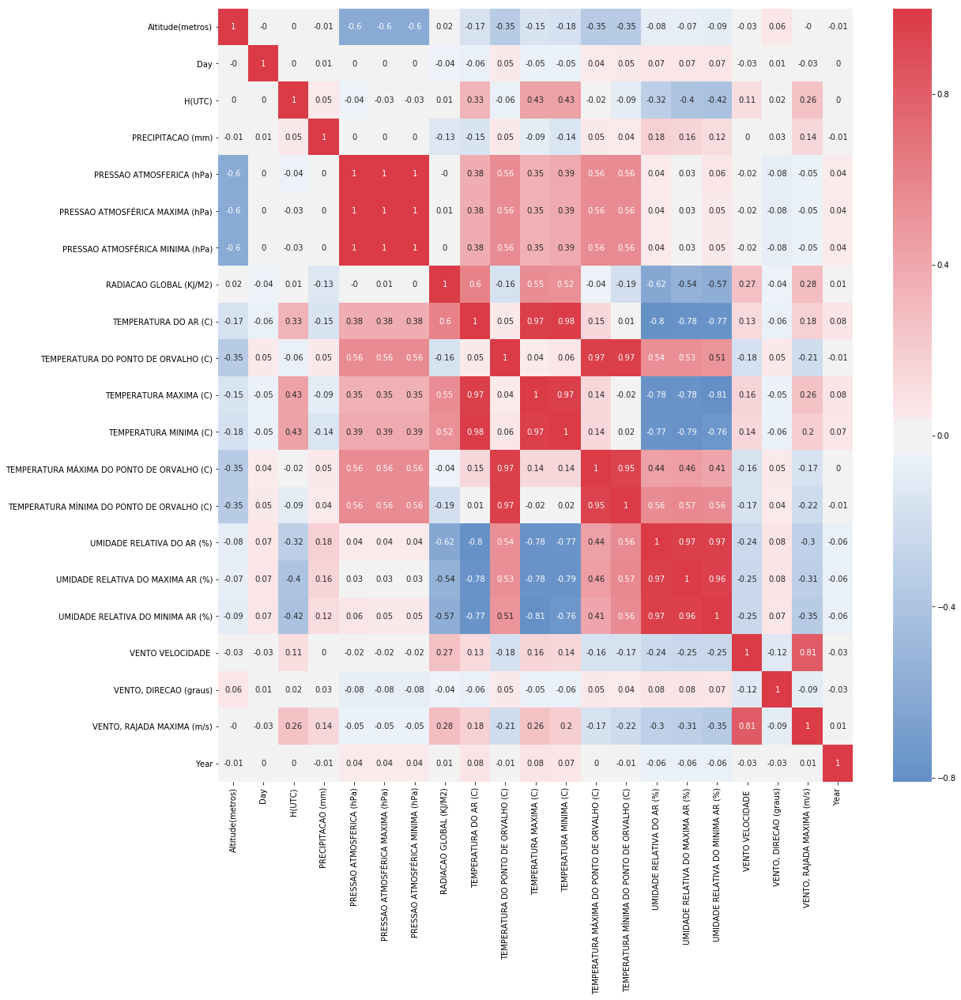

In [14]:
all_columns_num = data.columns.tolist()
all_columns_num.remove('Nome')
all_columns_num.remove('Month')
all_columns_num.remove('Latitude')
all_columns_num.remove('Longitude')
all_columns_num.remove('Codigo OMM')
all_columns_num.remove('Cidade')
all_columns_num.remove('Estado')
all_columns_num.remove('Regiao')
data_clean = data.dropna()
cor_matrix = data_clean[all_columns_num].corr().round(2)
# Plotting heatmap 
fig = plt.figure(figsize=(18,18));
sns.heatmap(cor_matrix, annot=True, center=0, cmap = sns.diverging_palette(250, 10, as_cmap=True), ax=plt.subplot(111));
plt.show()

## Fazendo um mapa para verificar como esta cada estação em relação a dados ausentes e a consistencias dos dados

In [12]:
def make_marker(name,lat,long,alt, temp_min,temp_max, temp_min_min,temp_min_max,
                temp_max_min,temp_max_max, prep_min,prep_max, ur_min,ur_max,
                ur_min_min,ur_min_max, ur_max_min,ur_max_max, miss_data_temp_min,
                miss_data_temp_max, miss_data_prep, miss_data_ur_min, miss_data_ur_max,
                miss_data_ur,color):
    return folium.Marker(location=[df_temp['Latitude'].unique()[0],df_temp['Longitude'].unique()[0]], 
                 popup='''
                 Name: {:s}
                 Latitude:{:f}
                 longitude:{:f}
                 Altitude(metros) : {:f}
                 Minimos e Maximos
                 
                 Temperatura do ar: {:f}\t{:f}
                 Temperatura Minima: {:f}\t{:F}
                 Temperatura Maxima:  {:f}\t{:f}
                 Precipitação: {:f}\t{:f}
                 Umidade Relativa: {:f}\t{:f}
                 UR Minima: {:f}\t{:f}
                 UR Maxima: {:f}\t{:f}
                 
                 Dados Ausentes
                 
                 Temperatura Minima: {:f}
                 Temperatura Maxima: {:f}
                 Precipitação: {:f}
                 UR Minima: {:f}
                 UR Maxima: {:f}
                 UR:{:f}
                 '''.format(name,lat,long,alt,
                            temp_min,temp_max,
                            temp_min_min,temp_min_max,
                            temp_max_min,temp_max_max,
                            prep_min,prep_max,
                            ur_min,ur_max,
                            ur_min_min,ur_min_max,
                            ur_max_min,ur_max_max,
                            miss_data_temp_min,
                            miss_data_temp_max,
                            miss_data_prep,
                            miss_data_ur_min,
                            miss_data_ur_max,
                            miss_data_ur), 
                icon=folium.Icon(color=color))

### Problemas procurados

##### - Temperatura minima              > Temperatura Maxima
##### - Temperatura(min,max,do ar)      < 0 OU Temperatura(min,max,do ar)>45
##### - Temperatura minima do Ponto de Orvalho              > Temperatura Maxima do Ponto de Orvalho
##### - Temperatura do Ponto de Orvalho(min,max,do ar)      < 0 OU Temperatura(min,max,do ar)>45
##### - Umidade Relativa(min,max,do ar) < 0 OU Umidade Relativa(min,max,do ar)   >100
##### - Umidade relativa minima         > Umidade relativa maxima
##### - Dados ausentes > 30

In [13]:
#Grupo de marcadores para possivel problemas
fg_miss_data          =      folium.FeatureGroup(name='Miss Data')
fg_temp_inconsistency =      folium.FeatureGroup(name='Temp correlation Inconsistency')
fg_temp_min           =      folium.FeatureGroup(name='Temp minima Inconsistency')
fg_temp               =      folium.FeatureGroup(name='Temp air Inconsistency')
fg_temp_max           =      folium.FeatureGroup(name='Temp Maxima Inconsistency')
fg_ur_inconsistency   =      folium.FeatureGroup(name='Umildade Relatica Inconsistency')

df_miss_data = pd.DataFrame(columns = ['Estação','Md_temp_max','Md_temp_min','Md_temp','Md_ur_max','Md_ur_min','MD_ur','Md_prec'])

recovery_list = []
danger_list = []
temp_min_list = []
temp_max_list = []
temp_inconsistency_list = []
temp_list = []
ur_list = []

for name in data['Nome'].unique().tolist():
    
    df_temp = data.loc[lambda df: df.Nome == name, :]
    #Maximo e minimos
    temp_min     = df_temp['TEMPERATURA DO AR (C)'].min()
    temp_max     = df_temp['TEMPERATURA DO AR (C)'].max()
    temp_min_min = df_temp['TEMPERATURA MINIMA (C)'].min()
    temp_min_max = df_temp['TEMPERATURA MINIMA (C)'].max()
    temp_max_min = df_temp['TEMPERATURA MAXIMA (C)'].min()
    temp_max_max = df_temp['TEMPERATURA MAXIMA (C)'].max()
    prep_max     = df_temp['PRECIPITACAO (mm)'].max()
    prep_min     = df_temp['PRECIPITACAO (mm)'].min()
    ur_max       = df_temp['UMIDADE RELATIVA DO AR (%)'].max()
    ur_min       = df_temp['UMIDADE RELATIVA DO AR (%)'].min()
    ur_max_max   = df_temp['UMIDADE RELATIVA DO MAXIMA AR (%)'].max()
    ur_max_min   = df_temp['UMIDADE RELATIVA DO MAXIMA AR (%)'].min()
    ur_min_max   = df_temp['UMIDADE RELATIVA DO MINIMA AR (%)'].max()
    ur_min_min   = df_temp['UMIDADE RELATIVA DO MINIMA AR (%)'].min()
    #Dados ausentes
    miss_data_temp     = (df_temp['TEMPERATURA DO AR (C)'].isnull().sum()/
                          len(df_temp['TEMPERATURA DO AR (C)']))*100
    miss_data_temp_min = (df_temp['TEMPERATURA MINIMA (C)'].isnull().sum()/
                          len(df_temp['TEMPERATURA MINIMA (C)']))*100
    miss_data_temp_max = (df_temp['TEMPERATURA MAXIMA (C)'].isnull().sum()/
                          len(df_temp['TEMPERATURA MAXIMA (C)']))*100
    miss_data_prep     = (df_temp['PRECIPITACAO (mm)'].isnull().sum()/
                          len(df_temp['PRECIPITACAO (mm)']))*100
    miss_data_ur_min   = (df_temp['UMIDADE RELATIVA DO MINIMA AR (%)'].isnull().sum()/
                          len(df_temp['UMIDADE RELATIVA DO MINIMA AR (%)']))*100
    miss_data_ur_max   = (df_temp['UMIDADE RELATIVA DO MAXIMA AR (%)'].isnull().sum()/
                          len(df_temp['UMIDADE RELATIVA DO MAXIMA AR (%)']))*100
    miss_data_ur       = (df_temp['UMIDADE RELATIVA DO AR (%)'].isnull().sum()/
                          len(df_temp['UMIDADE RELATIVA DO AR (%)']))*100
    #Estações com 10% a 50% de dados ausentes poderão ser interpolados
    miss_recovery = (miss_data_temp> 10 and miss_data_temp < 30,
                      miss_data_temp_min> 10 and miss_data_temp_min < 30,
                      miss_data_prep > 10 and miss_data_prep< 30,
                      miss_data_temp_max > 10 and miss_data_temp_max < 30,
                      miss_data_ur > 10 and miss_data_ur < 30,
                      miss_data_ur_max > 10 and miss_data_ur_max < 30,
                      miss_data_ur_min > 10 and miss_data_ur_min < 30)
    #Estações com 50% ou mais de dados ausentes poderam ser eliminadas
    miss_danger = (miss_data_temp > 30,miss_data_temp_min> 30,miss_data_prep> 30,
                   miss_data_temp_max> 30,miss_data_ur> 30,
                   miss_data_ur_max> 30,miss_data_ur_min > 30)
    
    df_miss_data = df_miss_data.append(pd.DataFrame([name,miss_data_temp_max,miss_data_temp_min,miss_data_temp,miss_data_ur_max,
              miss_data_ur_min,miss_data_ur,miss_data_prep], index = df_miss_data.columns.tolist()).T)
    if miss_danger == (1,1,1,1,1,1,1):
        color = 'red'
        danger_list.append(name)
    elif True in miss_recovery:
        color = 'purple'
        recovery_list.append(name)
    else:
        color = 'green'
    fg_miss_data.add_child(make_marker(name,df_temp['Latitude'].unique()[0],
                            df_temp['Longitude'].unique()[0],
                            df_temp['Altitude(metros)'].unique()[0],
                            temp_min,temp_max,
                            temp_min_min,temp_min_max,
                            temp_max_min,temp_max_max,
                            prep_min,prep_max,
                            ur_min,ur_max,
                            ur_min_min,ur_min_max,
                            ur_max_min,ur_max_max,
                            miss_data_temp_min,
                            miss_data_temp_max,
                            miss_data_prep,
                            miss_data_ur_min,
                            miss_data_ur_max,
                            miss_data_ur,color))
        
    temp_inconsistency = (df_temp['TEMPERATURA MAXIMA (C)'] <= df_temp['TEMPERATURA MINIMA (C)'])
    
    if True in temp_inconsistency:
        color = 'red'
        temp_inconsistency_list.append(name)
    else:
        color = 'green'
    fg_temp_inconsistency.add_child(make_marker(name,df_temp['Latitude'].unique()[0],
                            df_temp['Longitude'].unique()[0],
                            df_temp['Altitude(metros)'].unique()[0],
                            temp_min,temp_max,
                            temp_min_min,temp_min_max,
                            temp_max_min,temp_max_max,
                            prep_min,prep_max,
                            ur_min,ur_max,
                            ur_min_min,ur_min_max,
                            ur_max_min,ur_max_max,
                            miss_data_temp_min,
                            miss_data_temp_max,
                            miss_data_prep,
                            miss_data_ur_min,
                            miss_data_ur_max,
                            miss_data_ur,color))
    
    if (temp_max_min < 0) or (temp_max_max > 45):
        color = 'red'
        temp_max_list.append(name)
    else:
        color = 'green'
    fg_temp_max.add_child(make_marker(name,df_temp['Latitude'].unique()[0],
                            df_temp['Longitude'].unique()[0],
                            df_temp['Altitude(metros)'].unique()[0],
                            temp_min,temp_max,
                            temp_min_min,temp_min_max,
                            temp_max_min,temp_max_max,
                            prep_min,prep_max,
                            ur_min,ur_max,
                            ur_min_min,ur_min_max,
                            ur_max_min,ur_max_max,
                            miss_data_temp_min,
                            miss_data_temp_max,
                            miss_data_prep,
                            miss_data_ur_min,
                            miss_data_ur_max,
                            miss_data_ur,color))
    
    if (temp_min < 0) or (temp_max > 45):
        color = 'red'
        temp_list.append(name)
    else:
        color = 'green'
    fg_temp_inconsistency.add_child(make_marker(name,df_temp['Latitude'].unique()[0],
                            df_temp['Longitude'].unique()[0],
                            df_temp['Altitude(metros)'].unique()[0],
                            temp_min,temp_max,
                            temp_min_min,temp_min_max,
                            temp_max_min,temp_max_max,
                            prep_min,prep_max,
                            ur_min,ur_max,
                            ur_min_min,ur_min_max,
                            ur_max_min,ur_max_max,
                            miss_data_temp_min,
                            miss_data_temp_max,
                            miss_data_prep,
                            miss_data_ur_min,
                            miss_data_ur_max,
                            miss_data_ur,color))
    
    if (temp_min_min < 0) or (temp_min_max > 45):
        color = 'red'
        temp_min_list.append(name)
    else:
        color = 'green'
    
    fg_temp_min.add_child(make_marker(name,df_temp['Latitude'].unique()[0],
                            df_temp['Longitude'].unique()[0],
                            df_temp['Altitude(metros)'].unique()[0],
                            temp_min,temp_max,
                            temp_min_min,temp_min_max,
                            temp_max_min,temp_max_max,
                            prep_min,prep_max,
                            ur_min,ur_max,
                            ur_min_min,ur_min_max,
                            ur_max_min,ur_max_max,
                            miss_data_temp_min,
                            miss_data_temp_max,
                            miss_data_prep,
                            miss_data_ur_min,
                            miss_data_ur_max,
                            miss_data_ur,color))
    
    ur_min_danger = (ur_min < 0, ur_max_min < 0, ur_min_min < 0 )
    ur_max_danger = (ur_max >100,ur_max_max>100,ur_min_max>100)
    ur_inconsistency = (df_temp['UMIDADE RELATIVA DO MAXIMA AR (%)'] <= df_temp['UMIDADE RELATIVA DO MINIMA AR (%)'])
   
    if (True in ur_min_danger) or (True in ur_max_danger) or (True in ur_inconsistency):
        color = 'red'
        ur_list.append(name)
    else:
        color = 'green'
    fg_ur_inconsistency.add_child(make_marker(name,df_temp['Latitude'].unique()[0],
                            df_temp['Longitude'].unique()[0],
                            df_temp['Altitude(metros)'].unique()[0],
                            temp_min,temp_max,
                            temp_min_min,temp_min_max,
                            temp_max_min,temp_max_max,
                            prep_min,prep_max,
                            ur_min,ur_max,
                            ur_min_min,ur_min_max,
                            ur_max_min,ur_max_max,
                            miss_data_temp_min,
                            miss_data_temp_max,
                            miss_data_prep,
                            miss_data_ur_min,
                            miss_data_ur_max,
                            miss_data_ur,color))

map_miss_data          = folium.Map()
map_temp_inconsistency = folium.Map()
map_temp_min           = folium.Map()
map_temp_max           = folium.Map()
map_ur_inconsistency   = folium.Map()
map_miss_data.add_child(fg_miss_data).save(str(path_to_save+month_num+'/map_'+month_num+'_miss_data.html'))
map_temp_inconsistency.add_child(fg_temp_inconsistency).save(path_to_save+month_num+'/map_'+month_num+'_temp_incosistency.html')
map_temp_min.add_child(fg_temp_min).save(path_to_save+month_num+'/map_'+month_num+'_temp_min.html')
map_temp_max.add_child(fg_temp_max).save(path_to_save+month_num+'/map_'+month_num+'_temp_max.html')
map_ur_inconsistency.add_child(fg_ur_inconsistency).save(path_to_save+month_num+'/map_'+month_num+'_ur_incosistency.html')

df_miss_data = df_miss_data.reset_index(drop=True)
df_miss_data.to_csv(str(path_to_save+month_num+'/'+'Data_miss.csv'))

# Analisando as possiveis incosistencia nos dados 
## Verificando os dados da Umidade relativa

In [14]:
len(ur_list)

1

In [15]:
ur_list

['Parque Estadual Chandless-A102']

In [16]:
df_temp = data.loc[lambda df: df.Nome == 'Parque Estadual Chandless-A102', :].reset_index()
errors = df_temp.loc[df_temp['UMIDADE RELATIVA DO MAXIMA AR (%)']<=df_temp['UMIDADE RELATIVA DO MINIMA AR (%)'],:]['index'].tolist()
data.iloc[errors][['UMIDADE RELATIVA DO MAXIMA AR (%)','UMIDADE RELATIVA DO MINIMA AR (%)','UMIDADE RELATIVA DO AR (%)']].count()

UMIDADE RELATIVA DO MAXIMA AR (%)    1027
UMIDADE RELATIVA DO MINIMA AR (%)    1027
UMIDADE RELATIVA DO AR (%)           1027
dtype: int64

Como podemos ver os dados de umidade estão todos iguais nestes registros, por isso iremos retila-los

In [17]:
for er in errors:
        data.loc[er,'UMIDADE RELATIVA DO MAXIMA AR (%)'] = np.nan
        data.loc[er,'UMIDADE RELATIVA DO MINIMA AR (%)'] = np.nan
        data.loc[er,'UMIDADE RELATIVA DO AR (%)'] = np.nan

## Incosistencia nos dados de temperatura

In [18]:
temp_inconsistency_list

['Parque Estadual Chandless-A102']

### Foi encontrado apenas uma estação com incosistencia de dados de temperatura, vamos ver estes erros

In [19]:
df_temp = data.loc[lambda df: df.Nome == 'Parque Estadual Chandless-A102', :].reset_index()
errors = df_temp.loc[df_temp['TEMPERATURA MAXIMA (C)']<=df_temp['TEMPERATURA MINIMA (C)'],:]['index'].tolist()
data.iloc[errors].count()

Altitude(metros)                              20
Codigo OMM                                    20
Day                                           20
H(UTC)                                        20
Latitude                                      20
Longitude                                     20
Month                                         20
Nome                                          20
PRECIPITACAO (mm)                             20
PRESSAO ATMOSFERICA (hPa)                     20
PRESSAO ATMOSFÉRICA MAXIMA (hPa)              20
PRESSAO ATMOSFÉRICA MINIMA (hPa)              20
RADIACAO GLOBAL (KJ/M2)                        4
TEMPERATURA DO AR (C)                         20
TEMPERATURA DO PONTO DE ORVALHO (C)           20
TEMPERATURA MAXIMA (C)                        20
TEMPERATURA MINIMA (C)                        20
TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C)    20
TEMPERATURA MÍNIMA DO PONTO DE ORVALHO (C)    20
UMIDADE RELATIVA DO AR (%)                     9
UMIDADE RELATIVA DO 

#### Apenas uma estação foi encontrada com incosistencia na temperatura, e este problema é por causa que os dados de temperatura estão todos iguais

In [20]:
for er in errors:
        data.loc[er,'TEMPERATURA DO AR (C)'] = np.nan
        data.loc[er,'TEMPERATURA MAXIMA (C)'] = np.nan
        data.loc[er,'TEMPERATURA MINIMA (C)'] = np.nan

## Possiveis erros de temperatura maxima

In [21]:
len(temp_max_list)

2

In [22]:
temp_max_list

['Niquelândia-A004', 'Dionísio Cerqueira-A848']

In [26]:
map_temp_max

In [23]:
df_temp = data.loc[lambda df: df.Nome == temp_max_list[0], :]
df_temp.loc[df_temp['TEMPERATURA MAXIMA (C)']<0,:]

,Altitude(metros),Codigo OMM,Day,H(UTC),Latitude,Longitude,Month,Nome,PRECIPITACAO (mm),PRESSAO ATMOSFERICA (hPa),PRESSAO ATMOSFÉRICA MAXIMA (hPa),PRESSAO ATMOSFÉRICA MINIMA (hPa),RADIACAO GLOBAL (KJ/M2),TEMPERATURA DO AR (C),TEMPERATURA DO PONTO DE ORVALHO (C),TEMPERATURA MAXIMA (C),TEMPERATURA MINIMA (C),TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C),TEMPERATURA MÍNIMA DO PONTO DE ORVALHO (C),UMIDADE RELATIVA DO AR (%),UMIDADE RELATIVA DO MAXIMA AR (%),UMIDADE RELATIVA DO MINIMA AR (%),VENTO VELOCIDADE,"VENTO, DIRECAO (graus)","VENTO, RAJADA MAXIMA (m/s)",Year,Cidade,Estado,Regiao
424157,664.0,86690.0,14,5,-14.469358,-48.485756,2,Niquelândia-A004,0.4,935.2,935.8,935.2,NaN,NaN,NaN,-1.9,NaN,NaN,NaN,93.0,93.0,89.0,2.0,307.0,5.8,2007,Niquelândia,Goiás,Centro Oeste
424171,664.0,86690.0,14,19,-14.469358,-48.485756,2,Niquelândia-A004,0.0,933.0,933.8,933.0,974.03,NaN,NaN,-6.0,NaN,-9.1,NaN,84.0,85.0,80.0,3.4,310.0,8.0,2007,Niquelândia,Goiás,Centro Oeste
424178,664.0,86690.0,15,2,-14.469358,-48.485756,2,Niquelândia-A004,0.0,936.1,936.2,935.7,NaN,NaN,NaN,-3.9,NaN,-5.3,NaN,91.0,92.0,89.0,1.8,323.0,6.4,2007,Niquelândia,Goiás,Centro Oeste


In [24]:
df_temp.loc[df_temp['TEMPERATURA MAXIMA (C)']>40,:]


,Altitude(metros),Codigo OMM,Day,H(UTC),Latitude,Longitude,Month,Nome,PRECIPITACAO (mm),PRESSAO ATMOSFERICA (hPa),PRESSAO ATMOSFÉRICA MAXIMA (hPa),PRESSAO ATMOSFÉRICA MINIMA (hPa),RADIACAO GLOBAL (KJ/M2),TEMPERATURA DO AR (C),TEMPERATURA DO PONTO DE ORVALHO (C),TEMPERATURA MAXIMA (C),TEMPERATURA MINIMA (C),TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C),TEMPERATURA MÍNIMA DO PONTO DE ORVALHO (C),UMIDADE RELATIVA DO AR (%),UMIDADE RELATIVA DO MAXIMA AR (%),UMIDADE RELATIVA DO MINIMA AR (%),VENTO VELOCIDADE,"VENTO, DIRECAO (graus)","VENTO, RAJADA MAXIMA (m/s)",Year,Cidade,Estado,Regiao


In [25]:
df_temp = data.loc[lambda df: df.Nome == temp_max_list[1], :]
df_temp.loc[df_temp['TEMPERATURA MAXIMA (C)']<0,:]

,Altitude(metros),Codigo OMM,Day,H(UTC),Latitude,Longitude,Month,Nome,PRECIPITACAO (mm),PRESSAO ATMOSFERICA (hPa),PRESSAO ATMOSFÉRICA MAXIMA (hPa),PRESSAO ATMOSFÉRICA MINIMA (hPa),RADIACAO GLOBAL (KJ/M2),TEMPERATURA DO AR (C),TEMPERATURA DO PONTO DE ORVALHO (C),TEMPERATURA MAXIMA (C),TEMPERATURA MINIMA (C),TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C),TEMPERATURA MÍNIMA DO PONTO DE ORVALHO (C),UMIDADE RELATIVA DO AR (%),UMIDADE RELATIVA DO MAXIMA AR (%),UMIDADE RELATIVA DO MINIMA AR (%),VENTO VELOCIDADE,"VENTO, DIRECAO (graus)","VENTO, RAJADA MAXIMA (m/s)",Year,Cidade,Estado,Regiao
1226595,808.0,86936.0,7,3,-26.286562,-53.633114,2,Dionísio Cerqueira-A848,NaN,921.7,922.7,921.6,NaN,NaN,NaN,-3.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,2013,Dionísio Cerqueira,Santa Catarina,Sul
1226596,808.0,86936.0,7,4,-26.286562,-53.633114,2,Dionísio Cerqueira-A848,NaN,921.5,921.7,921.3,NaN,NaN,NaN,-6.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,2013,Dionísio Cerqueira,Santa Catarina,Sul
1226597,808.0,86936.0,7,5,-26.286562,-53.633114,2,Dionísio Cerqueira-A848,NaN,921.6,921.6,921.3,NaN,NaN,NaN,-2.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,2013,Dionísio Cerqueira,Santa Catarina,Sul
1226929,808.0,86936.0,21,1,-26.286562,-53.633114,2,Dionísio Cerqueira-A848,NaN,922.7,922.9,922.5,NaN,NaN,NaN,-0.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,2013,Dionísio Cerqueira,Santa Catarina,Sul
1226930,808.0,86936.0,21,2,-26.286562,-53.633114,2,Dionísio Cerqueira-A848,NaN,922.5,922.8,922.5,NaN,NaN,NaN,-2.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,2013,Dionísio Cerqueira,Santa Catarina,Sul
1226934,808.0,86936.0,21,6,-26.286562,-53.633114,2,Dionísio Cerqueira-A848,NaN,920.8,921.3,920.8,NaN,NaN,NaN,-0.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,2013,Dionísio Cerqueira,Santa Catarina,Sul


In [26]:
df_temp.loc[df_temp['TEMPERATURA MAXIMA (C)']>40,:]

,Altitude(metros),Codigo OMM,Day,H(UTC),Latitude,Longitude,Month,Nome,PRECIPITACAO (mm),PRESSAO ATMOSFERICA (hPa),PRESSAO ATMOSFÉRICA MAXIMA (hPa),PRESSAO ATMOSFÉRICA MINIMA (hPa),RADIACAO GLOBAL (KJ/M2),TEMPERATURA DO AR (C),TEMPERATURA DO PONTO DE ORVALHO (C),TEMPERATURA MAXIMA (C),TEMPERATURA MINIMA (C),TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C),TEMPERATURA MÍNIMA DO PONTO DE ORVALHO (C),UMIDADE RELATIVA DO AR (%),UMIDADE RELATIVA DO MAXIMA AR (%),UMIDADE RELATIVA DO MINIMA AR (%),VENTO VELOCIDADE,"VENTO, DIRECAO (graus)","VENTO, RAJADA MAXIMA (m/s)",Year,Cidade,Estado,Regiao
1226861,808.0,86936.0,18,5,-26.286562,-53.633114,2,Dionísio Cerqueira-A848,NaN,921.6,922.9,921.6,NaN,NaN,NaN,40.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,2013,Dionísio Cerqueira,Santa Catarina,Sul


#### Dois erros encontrados e as duas estações possuem erros, as temperaturas encotradas não fazem sentido para as regiões das estações, estes dados serão subistituidos por nan

In [27]:
for name in temp_max_list:
    df_temp = data.loc[lambda df: df.Nome == name, :].reset_index()
    errors = df_temp.loc[df_temp['TEMPERATURA MAXIMA (C)']<0,:]['index'].tolist()
    for er in errors:
        data.loc[er,'TEMPERATURA MAXIMA (C)'] = np.nan
    

In [28]:
for name in temp_max_list:
    df_temp = data.loc[lambda df: df.Nome == name, :].reset_index()
    errors = df_temp.loc[df_temp['TEMPERATURA MAXIMA (C)']>40,:]['index'].tolist()
    for er in errors:
        data.loc[er,'TEMPERATURA MAXIMA (C)'] = np.nan

## Possiveis erros de temperatura minima

In [29]:
len(temp_min_list)

3

In [30]:
map_temp_min

In [31]:
df_temp = data.loc[lambda df: df.Nome == temp_min_list[0], :]
df_temp.loc[df_temp['TEMPERATURA MINIMA (C)']<0,:]

,Altitude(metros),Codigo OMM,Day,H(UTC),Latitude,Longitude,Month,Nome,PRECIPITACAO (mm),PRESSAO ATMOSFERICA (hPa),PRESSAO ATMOSFÉRICA MAXIMA (hPa),PRESSAO ATMOSFÉRICA MINIMA (hPa),RADIACAO GLOBAL (KJ/M2),TEMPERATURA DO AR (C),TEMPERATURA DO PONTO DE ORVALHO (C),TEMPERATURA MAXIMA (C),TEMPERATURA MINIMA (C),TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C),TEMPERATURA MÍNIMA DO PONTO DE ORVALHO (C),UMIDADE RELATIVA DO AR (%),UMIDADE RELATIVA DO MAXIMA AR (%),UMIDADE RELATIVA DO MINIMA AR (%),VENTO VELOCIDADE,"VENTO, DIRECAO (graus)","VENTO, RAJADA MAXIMA (m/s)",Year,Cidade,Estado,Regiao
404914,727.0,86734.0,3,10,-16.642841,-49.220222,2,Goiânia-A002,0.0,934.9,934.9,933.3,29.935,16.1,15.4,20.6,-8.8,19.8,3.6,96.0,96.0,94.0,0.9,323.0,3.0,2009,Goiânia,Goias,Centro Oeste
405156,727.0,86734.0,13,12,-16.642841,-49.220222,2,Goiânia-A002,0.0,928.6,928.6,927.9,575.005,22.2,21.1,22.2,-1.9,21.1,9.7,93.0,97.0,93.0,0.0,270.0,1.3,2009,Goiânia,Goias,Centro Oeste


In [32]:
df_temp.loc[df_temp['TEMPERATURA MINIMA (C)']>40,:]

,Altitude(metros),Codigo OMM,Day,H(UTC),Latitude,Longitude,Month,Nome,PRECIPITACAO (mm),PRESSAO ATMOSFERICA (hPa),PRESSAO ATMOSFÉRICA MAXIMA (hPa),PRESSAO ATMOSFÉRICA MINIMA (hPa),RADIACAO GLOBAL (KJ/M2),TEMPERATURA DO AR (C),TEMPERATURA DO PONTO DE ORVALHO (C),TEMPERATURA MAXIMA (C),TEMPERATURA MINIMA (C),TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C),TEMPERATURA MÍNIMA DO PONTO DE ORVALHO (C),UMIDADE RELATIVA DO AR (%),UMIDADE RELATIVA DO MAXIMA AR (%),UMIDADE RELATIVA DO MINIMA AR (%),VENTO VELOCIDADE,"VENTO, DIRECAO (graus)","VENTO, RAJADA MAXIMA (m/s)",Year,Cidade,Estado,Regiao


In [33]:
df_temp = data.loc[lambda df: df.Nome == temp_min_list[1], :]
df_temp.loc[df_temp['TEMPERATURA MINIMA (C)']<0,:]

,Altitude(metros),Codigo OMM,Day,H(UTC),Latitude,Longitude,Month,Nome,PRECIPITACAO (mm),PRESSAO ATMOSFERICA (hPa),PRESSAO ATMOSFÉRICA MAXIMA (hPa),PRESSAO ATMOSFÉRICA MINIMA (hPa),RADIACAO GLOBAL (KJ/M2),TEMPERATURA DO AR (C),TEMPERATURA DO PONTO DE ORVALHO (C),TEMPERATURA MAXIMA (C),TEMPERATURA MINIMA (C),TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C),TEMPERATURA MÍNIMA DO PONTO DE ORVALHO (C),UMIDADE RELATIVA DO AR (%),UMIDADE RELATIVA DO MAXIMA AR (%),UMIDADE RELATIVA DO MINIMA AR (%),VENTO VELOCIDADE,"VENTO, DIRECAO (graus)","VENTO, RAJADA MAXIMA (m/s)",Year,Cidade,Estado,Regiao
424053,664.0,86690.0,9,21,-14.469358,-48.485756,2,Niquelândia-A004,19.0,938.7,938.8,937.6,204.153,14.9,14.0,27.5,-6.8,21.9,-6.2,94.0,94.0,68.0,1.8,299.0,21.0,2007,Niquelândia,Goiás,Centro Oeste
424181,664.0,86690.0,15,5,-14.469358,-48.485756,2,Niquelândia-A004,0.2,935.1,935.8,935.1,NaN,10.6,9.8,11.9,-10.0,11.1,NaN,95.0,95.0,95.0,0.0,158.0,4.5,2007,Niquelândia,Goiás,Centro Oeste
424187,664.0,86690.0,15,11,-14.469358,-48.485756,2,Niquelândia-A004,0.4,936.1,936.1,935.2,463.053,19.4,18.7,19.4,-0.5,18.7,0.1,96.0,96.0,96.0,0.8,333.0,2.4,2007,Niquelândia,Goiás,Centro Oeste


In [34]:
df_temp.loc[df_temp['TEMPERATURA MINIMA (C)']>40,:]

,Altitude(metros),Codigo OMM,Day,H(UTC),Latitude,Longitude,Month,Nome,PRECIPITACAO (mm),PRESSAO ATMOSFERICA (hPa),PRESSAO ATMOSFÉRICA MAXIMA (hPa),PRESSAO ATMOSFÉRICA MINIMA (hPa),RADIACAO GLOBAL (KJ/M2),TEMPERATURA DO AR (C),TEMPERATURA DO PONTO DE ORVALHO (C),TEMPERATURA MAXIMA (C),TEMPERATURA MINIMA (C),TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C),TEMPERATURA MÍNIMA DO PONTO DE ORVALHO (C),UMIDADE RELATIVA DO AR (%),UMIDADE RELATIVA DO MAXIMA AR (%),UMIDADE RELATIVA DO MINIMA AR (%),VENTO VELOCIDADE,"VENTO, DIRECAO (graus)","VENTO, RAJADA MAXIMA (m/s)",Year,Cidade,Estado,Regiao


In [35]:
df_temp = data.loc[lambda df: df.Nome == temp_min_list[1], :]
df_temp.loc[df_temp['TEMPERATURA MINIMA (C)']<0,:]

,Altitude(metros),Codigo OMM,Day,H(UTC),Latitude,Longitude,Month,Nome,PRECIPITACAO (mm),PRESSAO ATMOSFERICA (hPa),PRESSAO ATMOSFÉRICA MAXIMA (hPa),PRESSAO ATMOSFÉRICA MINIMA (hPa),RADIACAO GLOBAL (KJ/M2),TEMPERATURA DO AR (C),TEMPERATURA DO PONTO DE ORVALHO (C),TEMPERATURA MAXIMA (C),TEMPERATURA MINIMA (C),TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C),TEMPERATURA MÍNIMA DO PONTO DE ORVALHO (C),UMIDADE RELATIVA DO AR (%),UMIDADE RELATIVA DO MAXIMA AR (%),UMIDADE RELATIVA DO MINIMA AR (%),VENTO VELOCIDADE,"VENTO, DIRECAO (graus)","VENTO, RAJADA MAXIMA (m/s)",Year,Cidade,Estado,Regiao
424053,664.0,86690.0,9,21,-14.469358,-48.485756,2,Niquelândia-A004,19.0,938.7,938.8,937.6,204.153,14.9,14.0,27.5,-6.8,21.9,-6.2,94.0,94.0,68.0,1.8,299.0,21.0,2007,Niquelândia,Goiás,Centro Oeste
424181,664.0,86690.0,15,5,-14.469358,-48.485756,2,Niquelândia-A004,0.2,935.1,935.8,935.1,NaN,10.6,9.8,11.9,-10.0,11.1,NaN,95.0,95.0,95.0,0.0,158.0,4.5,2007,Niquelândia,Goiás,Centro Oeste
424187,664.0,86690.0,15,11,-14.469358,-48.485756,2,Niquelândia-A004,0.4,936.1,936.1,935.2,463.053,19.4,18.7,19.4,-0.5,18.7,0.1,96.0,96.0,96.0,0.8,333.0,2.4,2007,Niquelândia,Goiás,Centro Oeste


In [36]:
df_temp.loc[df_temp['TEMPERATURA MINIMA (C)']>40,:]

,Altitude(metros),Codigo OMM,Day,H(UTC),Latitude,Longitude,Month,Nome,PRECIPITACAO (mm),PRESSAO ATMOSFERICA (hPa),PRESSAO ATMOSFÉRICA MAXIMA (hPa),PRESSAO ATMOSFÉRICA MINIMA (hPa),RADIACAO GLOBAL (KJ/M2),TEMPERATURA DO AR (C),TEMPERATURA DO PONTO DE ORVALHO (C),TEMPERATURA MAXIMA (C),TEMPERATURA MINIMA (C),TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C),TEMPERATURA MÍNIMA DO PONTO DE ORVALHO (C),UMIDADE RELATIVA DO AR (%),UMIDADE RELATIVA DO MAXIMA AR (%),UMIDADE RELATIVA DO MINIMA AR (%),VENTO VELOCIDADE,"VENTO, DIRECAO (graus)","VENTO, RAJADA MAXIMA (m/s)",Year,Cidade,Estado,Regiao


Mesmo caso do atribulto anterior, e as cidades encontradas nao tem registros de temperatura encontradas tão baixas

In [37]:
for name in temp_min_list:
    df_temp = data.loc[lambda df: df.Nome == name, :].reset_index()
    errors = df_temp.loc[df_temp['TEMPERATURA MINIMA (C)']<0,:]['index'].tolist()
    for er in errors:
        data.loc[er,'TEMPERATURA MINIMA (C)'] = np.nan

In [38]:
for name in temp_min_list:
    df_temp = data.loc[lambda df: df.Nome == name, :].reset_index()
    errors = df_temp.loc[df_temp['TEMPERATURA MINIMA (C)']>40,:]['index'].tolist()
    for er in errors:
        data.loc[er,'TEMPERATURA MINIMA (C)'] = np.nan

In [39]:
(data.isnull().sum()/len(data))*100

Altitude(metros)                               0.000000
Codigo OMM                                     0.045976
Day                                            0.000000
H(UTC)                                         0.000000
Latitude                                       0.000000
Longitude                                      0.000000
Month                                          0.000000
Nome                                           0.000000
PRECIPITACAO (mm)                             13.568915
PRESSAO ATMOSFERICA (hPa)                      9.833107
PRESSAO ATMOSFÉRICA MAXIMA (hPa)               9.887083
PRESSAO ATMOSFÉRICA MINIMA (hPa)               9.886780
RADIACAO GLOBAL (KJ/M2)                       52.043995
TEMPERATURA DO AR (C)                          9.516180
TEMPERATURA DO PONTO DE ORVALHO (C)           10.607915
TEMPERATURA MAXIMA (C)                         9.512383
TEMPERATURA MINIMA (C)                         9.515172
TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C)    10

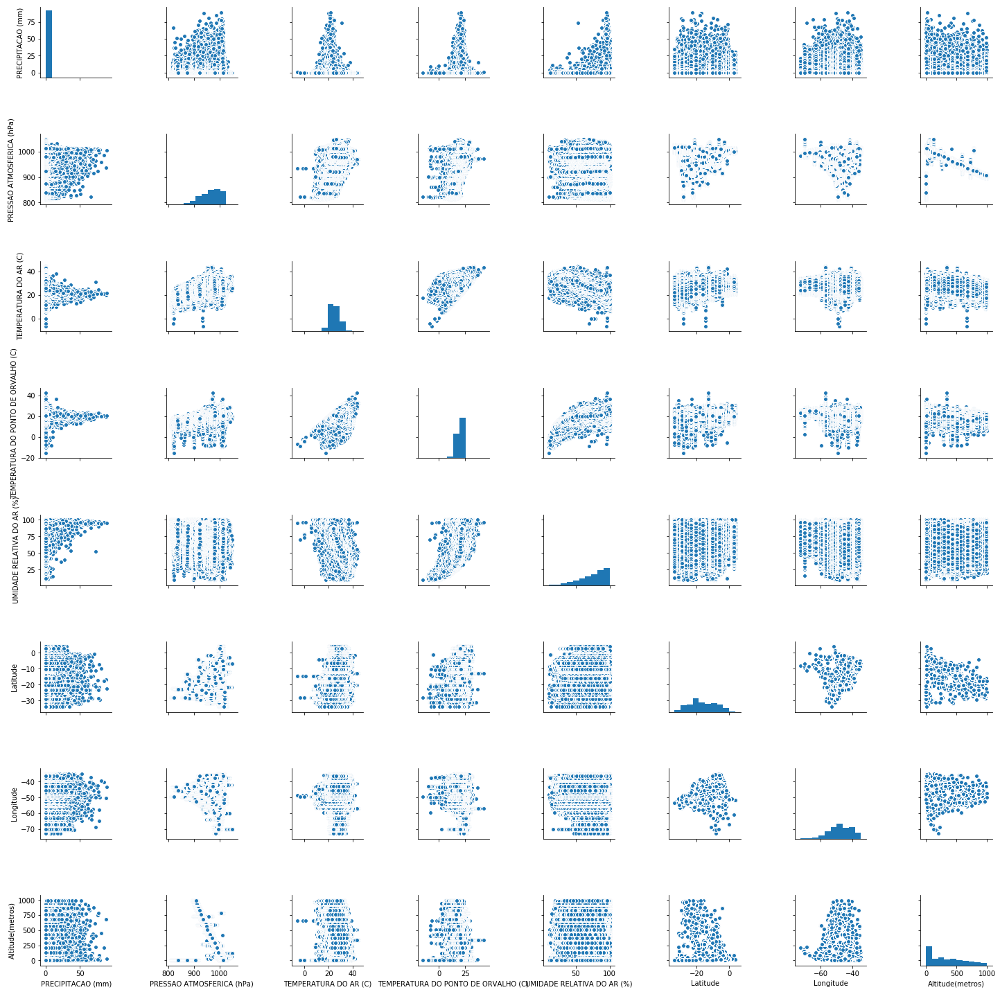

In [40]:
sns.pairplot(data[['PRECIPITACAO (mm)','PRESSAO ATMOSFERICA (hPa)','TEMPERATURA DO AR (C)','TEMPERATURA DO PONTO DE ORVALHO (C)',
                   'UMIDADE RELATIVA DO AR (%)','Latitude','Longitude','Altitude(metros)']].dropna(),)

#### Como podemos ver existe alguns dados fora do padrão dos demais registro, como os dados de Pressão atmosferica que podemos perceber que sua relação com Altidude não esta muito correta. iremos retirar este dados também

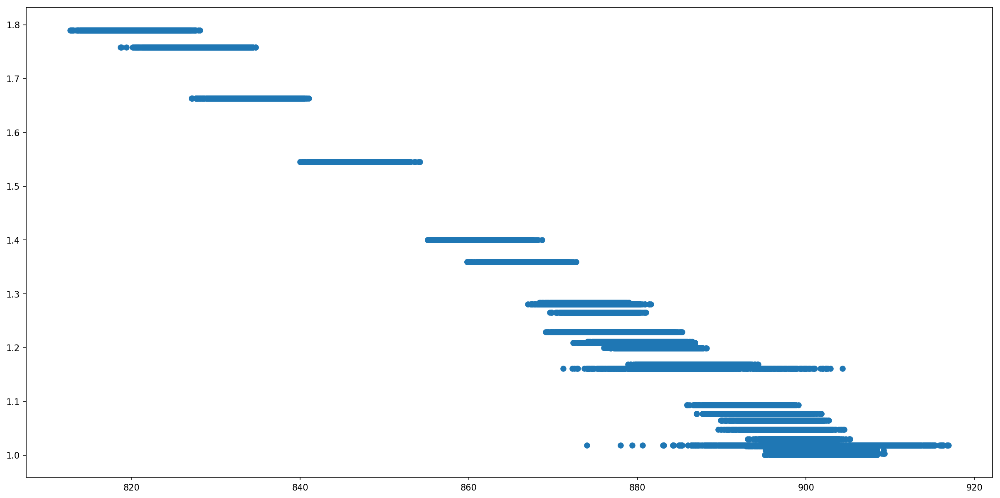

In [45]:
plt.figure(figsize=(20, 10), dpi=150)
plt.scatter(data.loc[(data['Altitude(metros)']>0) & (data['Altitude(metros)']<100)&(data['PRESSAO ATMOSFERICA (hPa)']<950),:]['PRESSAO ATMOSFERICA (hPa)'],
           data.loc[(data['Altitude(metros)']>0) & (data['Altitude(metros)']<100)&(data['PRESSAO ATMOSFERICA (hPa)']<950),:]['Altitude(metros)'])


In [41]:
data.loc[(data['Altitude(metros)']>0) & (data['Altitude(metros)']<100)&(data['PRESSAO ATMOSFERICA (hPa)']<950),:].head(10)

,Altitude(metros),Codigo OMM,Day,H(UTC),Latitude,Longitude,Month,Nome,PRECIPITACAO (mm),PRESSAO ATMOSFERICA (hPa),PRESSAO ATMOSFÉRICA MAXIMA (hPa),PRESSAO ATMOSFÉRICA MINIMA (hPa),RADIACAO GLOBAL (KJ/M2),TEMPERATURA DO AR (C),TEMPERATURA DO PONTO DE ORVALHO (C),TEMPERATURA MAXIMA (C),TEMPERATURA MINIMA (C),TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C),TEMPERATURA MÍNIMA DO PONTO DE ORVALHO (C),UMIDADE RELATIVA DO AR (%),UMIDADE RELATIVA DO MAXIMA AR (%),UMIDADE RELATIVA DO MINIMA AR (%),VENTO VELOCIDADE,"VENTO, DIRECAO (graus)","VENTO, RAJADA MAXIMA (m/s)",Year,Cidade,Estado,Regiao
376344,1.161,86715.0,1,0,-15.789343,-47.925756,2,Brasília-A001,0.0,885.4,885.4,884.6,NaN,22.3,17.7,22.5,21.9,17.7,16.2,75.0,75.0,70.0,0.9,52.0,3.7,2001,Brasília,Distrito Federal,Centro Oeste
376345,1.161,86715.0,1,1,-15.789343,-47.925756,2,Brasília-A001,0.0,886.1,886.1,885.4,NaN,20.3,17.0,22.2,20.3,17.7,16.9,81.0,82.0,75.0,0.4,269.0,2.9,2001,Brasília,Distrito Federal,Centro Oeste
376346,1.161,86715.0,1,2,-15.789343,-47.925756,2,Brasília-A001,0.0,885.9,886.2,885.9,NaN,20.1,17.0,20.2,19.9,17.0,16.8,82.0,83.0,81.0,0.8,300.0,2.2,2001,Brasília,Distrito Federal,Centro Oeste
376347,1.161,86715.0,1,3,-15.789343,-47.925756,2,Brasília-A001,0.0,885.1,885.9,885.1,NaN,20.7,17.7,20.7,19.8,17.9,16.9,83.0,85.0,82.0,1.1,300.0,2.6,2001,Brasília,Distrito Federal,Centro Oeste
376348,1.161,86715.0,1,4,-15.789343,-47.925756,2,Brasília-A001,0.0,885.1,885.1,884.9,NaN,20.6,18.0,20.6,19.6,18.0,17.3,85.0,87.0,83.0,0.5,181.0,2.6,2001,Brasília,Distrito Federal,Centro Oeste
376349,1.161,86715.0,1,5,-15.789343,-47.925756,2,Brasília-A001,0.0,884.7,885.2,884.7,NaN,19.6,17.9,20.6,18.9,18.1,17.3,90.0,91.0,85.0,0.0,315.0,1.6,2001,Brasília,Distrito Federal,Centro Oeste
376350,1.161,86715.0,1,6,-15.789343,-47.925756,2,Brasília-A001,0.0,884.9,885.0,884.7,NaN,19.9,18.1,19.9,19.4,18.2,17.8,89.0,91.0,89.0,1.5,207.0,3.2,2001,Brasília,Distrito Federal,Centro Oeste
376351,1.161,86715.0,1,7,-15.789343,-47.925756,2,Brasília-A001,0.0,884.7,885.0,884.7,NaN,19.9,18.3,20.0,19.6,18.4,18.1,90.0,91.0,89.0,2.4,215.0,3.6,2001,Brasília,Distrito Federal,Centro Oeste
376352,1.161,86715.0,1,8,-15.789343,-47.925756,2,Brasília-A001,0.0,885.0,885.0,884.7,NaN,19.8,18.2,19.9,19.6,18.3,18.1,90.0,92.0,90.0,1.6,226.0,3.5,2001,Brasília,Distrito Federal,Centro Oeste
376353,1.161,86715.0,1,9,-15.789343,-47.925756,2,Brasília-A001,0.0,885.3,885.3,885.0,NaN,19.2,18.0,20.0,19.2,18.2,17.7,92.0,92.0,89.0,1.3,326.0,3.5,2001,Brasília,Distrito Federal,Centro Oeste


In [42]:
errors = data.loc[(data['Altitude(metros)']>0) & (data['Altitude(metros)']<100)&(data['PRESSAO ATMOSFERICA (hPa)']<950),:].index.tolist()
print('Numero de resgitros que serão retirados: {}'.format(len(errors)))
for er in errors:
        data.loc[er,'PRESSAO ATMOSFERICA (hPa)'] = np.nan

Numero de resgitros que serão retirados: 158204


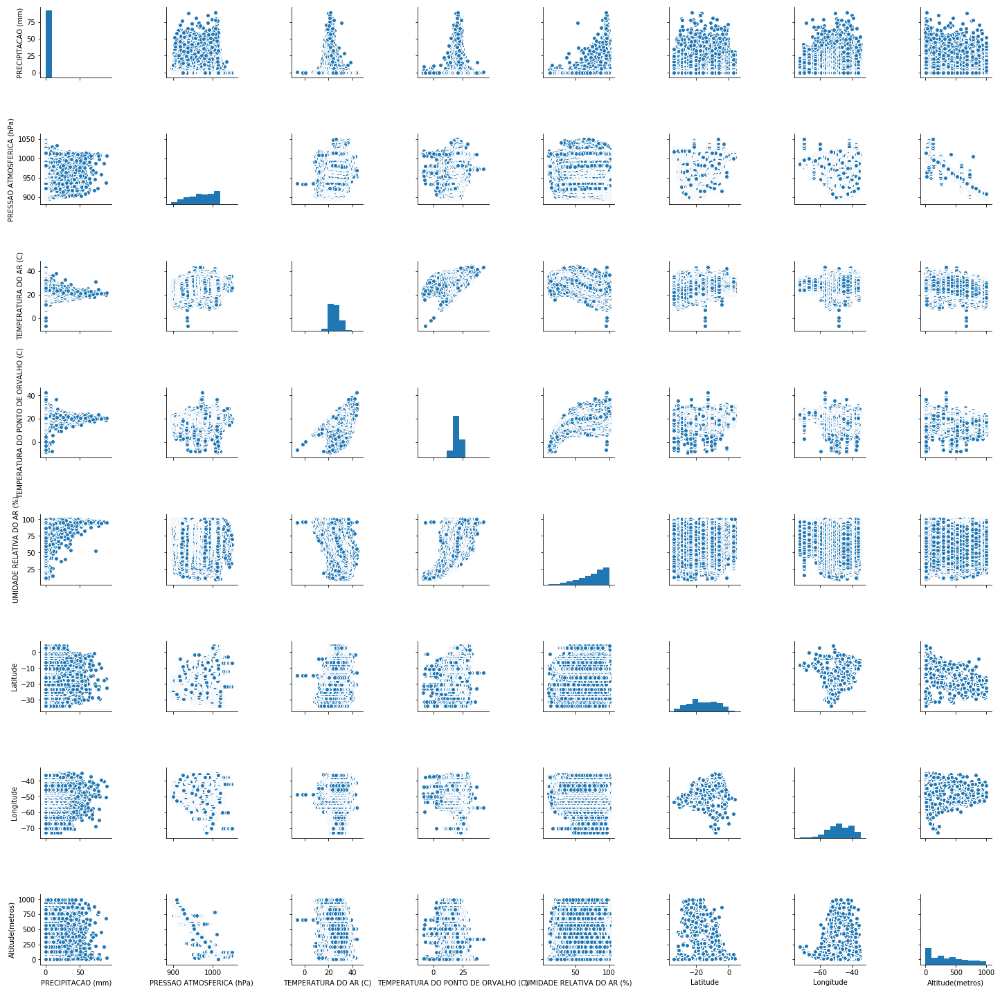

In [50]:
sns.pairplot(data[['PRECIPITACAO (mm)','PRESSAO ATMOSFERICA (hPa)','TEMPERATURA DO AR (C)','TEMPERATURA DO PONTO DE ORVALHO (C)',
                   'UMIDADE RELATIVA DO AR (%)','Latitude','Longitude','Altitude(metros)']].dropna(),)

#### Ainda a alguns registros fora do comportament dos restantes, estes outliers serão retirados também

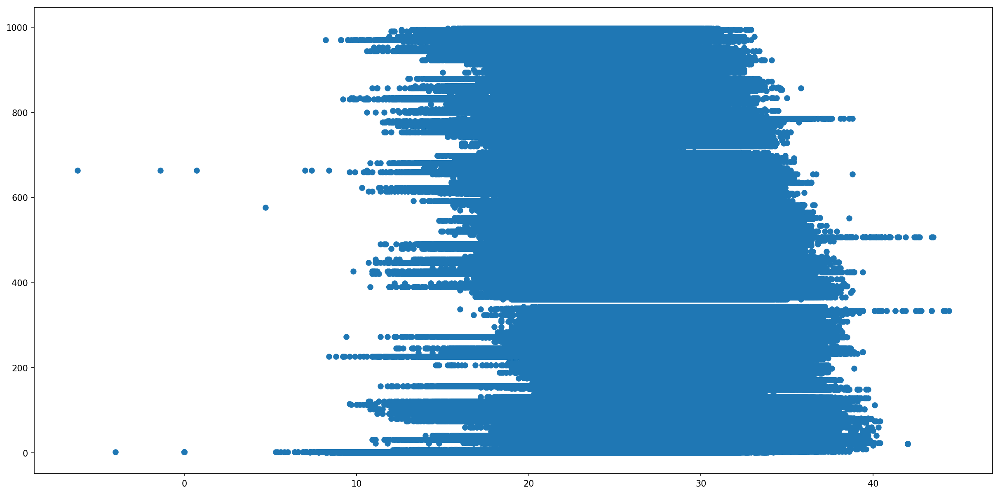

In [51]:
plt.figure(figsize=(20, 10), dpi=150)
plt.scatter(data['TEMPERATURA DO AR (C)'],data['Altitude(metros)'])

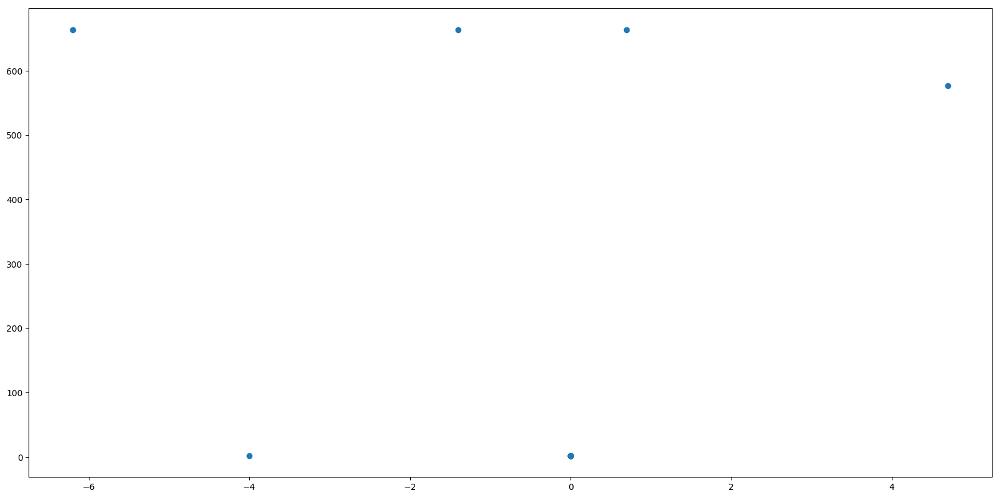

In [61]:
plt.figure(figsize=(20,10),dpi=100)
plt.scatter(data.loc[(data['TEMPERATURA DO AR (C)']<5)]['TEMPERATURA DO AR (C)'],data.loc[(data['TEMPERATURA DO AR (C)']<5)]['Altitude(metros)'])

In [43]:
errors = data.loc[(data['TEMPERATURA DO AR (C)']<6)].index.tolist()
print('Numero de resgitros que serão retirados: {}'.format(len(errors)))
data.loc[errors,'TEMPERATURA DO AR (C)'] = np.nan

Numero de resgitros que serão retirados: 17


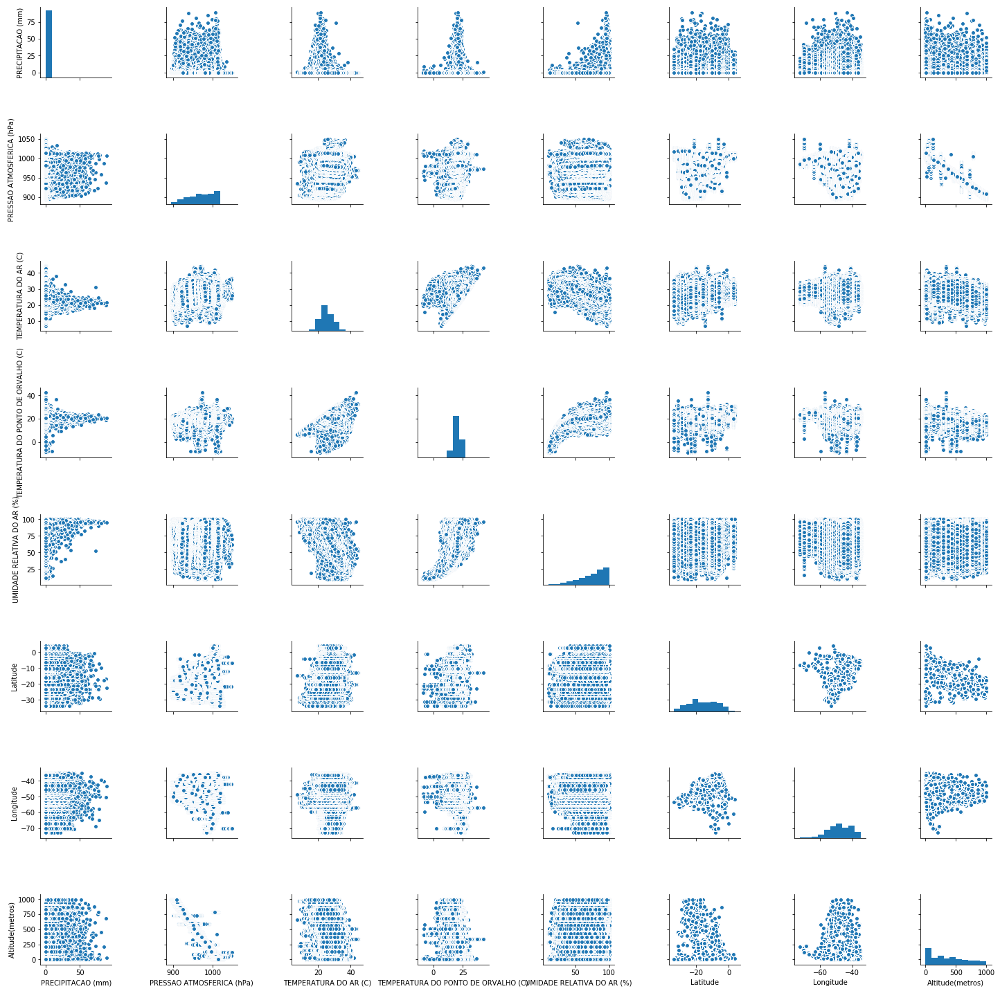

In [64]:
sns.pairplot(data[['PRECIPITACAO (mm)','PRESSAO ATMOSFERICA (hPa)','TEMPERATURA DO AR (C)','TEMPERATURA DO PONTO DE ORVALHO (C)',
                   'UMIDADE RELATIVA DO AR (%)','Latitude','Longitude','Altitude(metros)']].dropna(),)

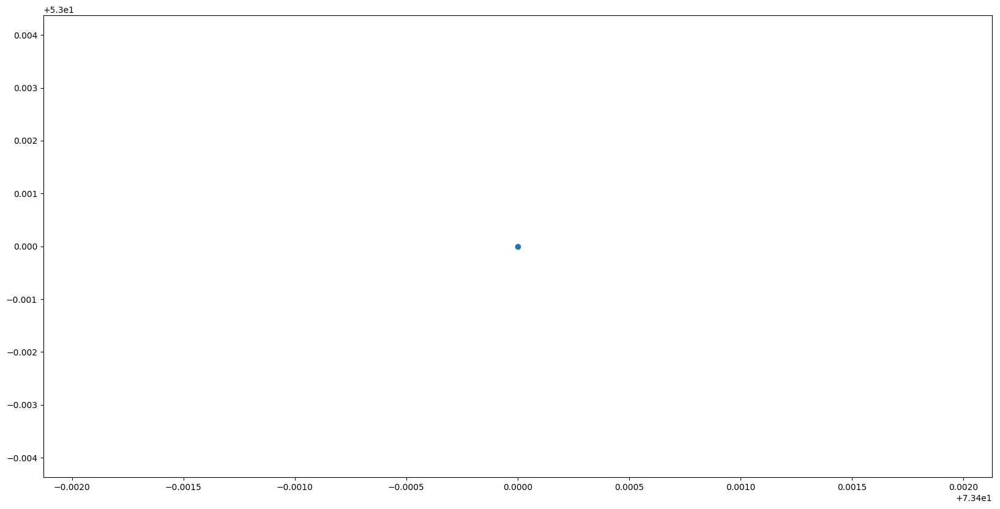

In [84]:
plt.figure(figsize=(20,10),dpi=100)
plt.scatter(data.loc[(data['UMIDADE RELATIVA DO AR (%)']<60) & (data['PRECIPITACAO (mm)']>70)]['PRECIPITACAO (mm)'],
            data.loc[(data['UMIDADE RELATIVA DO AR (%)']<60) & (data['PRECIPITACAO (mm)']>70)]['UMIDADE RELATIVA DO AR (%)'])

In [87]:
data.loc[(data['UMIDADE RELATIVA DO AR (%)']<60) & (data['PRECIPITACAO (mm)']>70)]

,Altitude(metros),Codigo OMM,Day,H(UTC),Latitude,Longitude,Month,Nome,PRECIPITACAO (mm),PRESSAO ATMOSFERICA (hPa),PRESSAO ATMOSFÉRICA MAXIMA (hPa),PRESSAO ATMOSFÉRICA MINIMA (hPa),RADIACAO GLOBAL (KJ/M2),TEMPERATURA DO AR (C),TEMPERATURA DO PONTO DE ORVALHO (C),TEMPERATURA MAXIMA (C),TEMPERATURA MINIMA (C),TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C),TEMPERATURA MÍNIMA DO PONTO DE ORVALHO (C),UMIDADE RELATIVA DO AR (%),UMIDADE RELATIVA DO MAXIMA AR (%),UMIDADE RELATIVA DO MINIMA AR (%),VENTO VELOCIDADE,"VENTO, DIRECAO (graus)","VENTO, RAJADA MAXIMA (m/s)",Year,Cidade,Estado,Regiao
2111728,408.0,86839.0,5,16,-21.085675,-49.920388,2,José Bonifácio-A735,73.4,964.6,965.8,964.6,3035.222,31.0,20.2,31.8,30.7,21.6,19.1,53.0,58.0,49.0,1.5,300.0,5.0,2009,José Bonifácio,São Paulo,Sudeste


In [44]:
errors = data.loc[(data['UMIDADE RELATIVA DO AR (%)']<60) & (data['PRECIPITACAO (mm)']>70)].index[0]
data.loc[errors,'UMIDADE RELATIVA DO AR (%)'] = np.nan

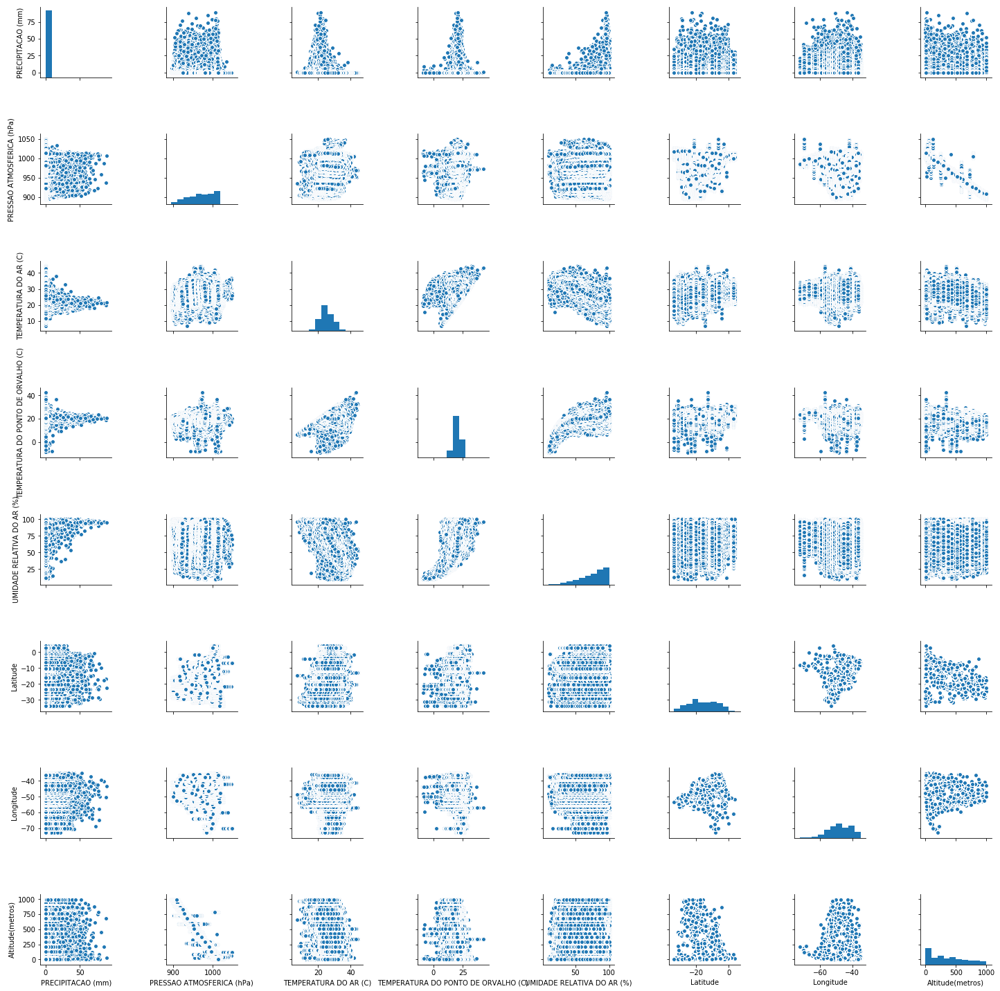

In [89]:
sns.pairplot(data[['PRECIPITACAO (mm)','PRESSAO ATMOSFERICA (hPa)','TEMPERATURA DO AR (C)','TEMPERATURA DO PONTO DE ORVALHO (C)',
                   'UMIDADE RELATIVA DO AR (%)','Latitude','Longitude','Altitude(metros)']].dropna(),)

In [45]:
(data.isnull().sum()/len(data))*100

Altitude(metros)                               0.000000
Codigo OMM                                     0.045976
Day                                            0.000000
H(UTC)                                         0.000000
Latitude                                       0.000000
Longitude                                      0.000000
Month                                          0.000000
Nome                                           0.000000
PRECIPITACAO (mm)                             13.568915
PRESSAO ATMOSFERICA (hPa)                     15.150088
PRESSAO ATMOSFÉRICA MAXIMA (hPa)               9.887083
PRESSAO ATMOSFÉRICA MINIMA (hPa)               9.886780
RADIACAO GLOBAL (KJ/M2)                       52.043995
TEMPERATURA DO AR (C)                          9.516752
TEMPERATURA DO PONTO DE ORVALHO (C)           10.607915
TEMPERATURA MAXIMA (C)                         9.512383
TEMPERATURA MINIMA (C)                         9.515172
TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C)    10

In [46]:
data.to_csv('./Tempo-Clima/Dados/Brasil_2_data_nan_v2.csv')

## Retirando os dados ausentes

### por trabalhamos com medias não iremos fazer recuperação dos dados ausentes apenas discarta-los.
### mas primeiro iremos descarta o atribulto de radiação global, que ja ele esta ausente em 50% da base

In [50]:
data.drop(columns=['RADIACAO GLOBAL (KJ/M2)','VENTO VELOCIDADE ','VENTO, DIRECAO (graus)','VENTO, RAJADA MAXIMA (m/s)'],inplace=True)

In [51]:
data.dropna(inplace=True)

In [66]:
data.shape

(2364897, 25)

In [93]:
data.to_csv('./Tempo-Clima/Dados/Brasil_2_data_clean_v2.csv')


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as skt
data = pd.read_csv('./Tempo-Clima/Dados/Brasil_2_data_clean_v2.csv').drop(columns=['Unnamed: 0'])
data.head(5)

,Altitude(metros),Codigo OMM,Day,H(UTC),Latitude,Longitude,Month,Nome,PRECIPITACAO (mm),PRESSAO ATMOSFERICA (hPa),...,TEMPERATURA MINIMA (C),TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C),TEMPERATURA MÍNIMA DO PONTO DE ORVALHO (C),UMIDADE RELATIVA DO AR (%),UMIDADE RELATIVA DO MAXIMA AR (%),UMIDADE RELATIVA DO MINIMA AR (%),Year,Cidade,Estado,Regiao
0,185.0,81963.0,1,0,-9.358353,-69.926257,2,Parque Estadual Chandless-A102,0.0,987.3,...,24.5,24.2,23.5,95.0,95.0,92.0,2009,Parque Estadual Chandless,Acre,Norte
1,185.0,81963.0,1,3,-9.358353,-69.926257,2,Parque Estadual Chandless-A102,0.0,989.8,...,23.4,23.2,22.6,95.0,96.0,95.0,2009,Parque Estadual Chandless,Acre,Norte
2,185.0,81963.0,1,4,-9.358353,-69.926257,2,Parque Estadual Chandless-A102,0.0,989.8,...,23.0,22.7,22.3,96.0,96.0,95.0,2009,Parque Estadual Chandless,Acre,Norte
3,185.0,81963.0,1,12,-9.358353,-69.926257,2,Parque Estadual Chandless-A102,0.0,992.1,...,22.6,23.1,22.1,96.0,97.0,96.0,2009,Parque Estadual Chandless,Acre,Norte
4,185.0,81963.0,1,13,-9.358353,-69.926257,2,Parque Estadual Chandless-A102,0.2,992.8,...,23.7,24.8,23.1,89.0,96.0,89.0,2009,Parque Estadual Chandless,Acre,Norte


In [94]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Altitude(metros),2364897.0,372.995850,286.348695,1.161000,104.000000,338.000000,577.000000,997.000000
Codigo OMM,2364897.0,85343.951486,2265.075175,81609.000000,81976.000000,86729.000000,86860.000000,86998.000000
Day,2364897.0,14.701578,8.165438,1.000000,8.000000,15.000000,22.000000,29.000000
H(UTC),2364897.0,11.570071,6.930050,0.000000,6.000000,12.000000,18.000000,23.000000
Latitude,2364897.0,-15.816420,8.215162,-33.742297,-22.358052,-16.160327,-9.285880,3.813583
Longitude,2364897.0,-47.627310,6.891065,-72.747838,-52.398090,-48.164817,-41.958327,-34.815627
Month,2364897.0,2.000000,0.000000,2.000000,2.000000,2.000000,2.000000,2.000000
PRECIPITACAO (mm),2364897.0,0.227295,1.626740,0.000000,0.000000,0.000000,0.000000,89.000000
PRESSAO ATMOSFERICA (hPa),2364897.0,969.847041,31.413935,895.100000,946.900000,973.100000,998.900000,1049.200000
PRESSAO ATMOSFÉRICA MAXIMA (hPa),2364897.0,970.138210,31.423332,886.700000,947.200000,973.400000,999.300000,1049.200000


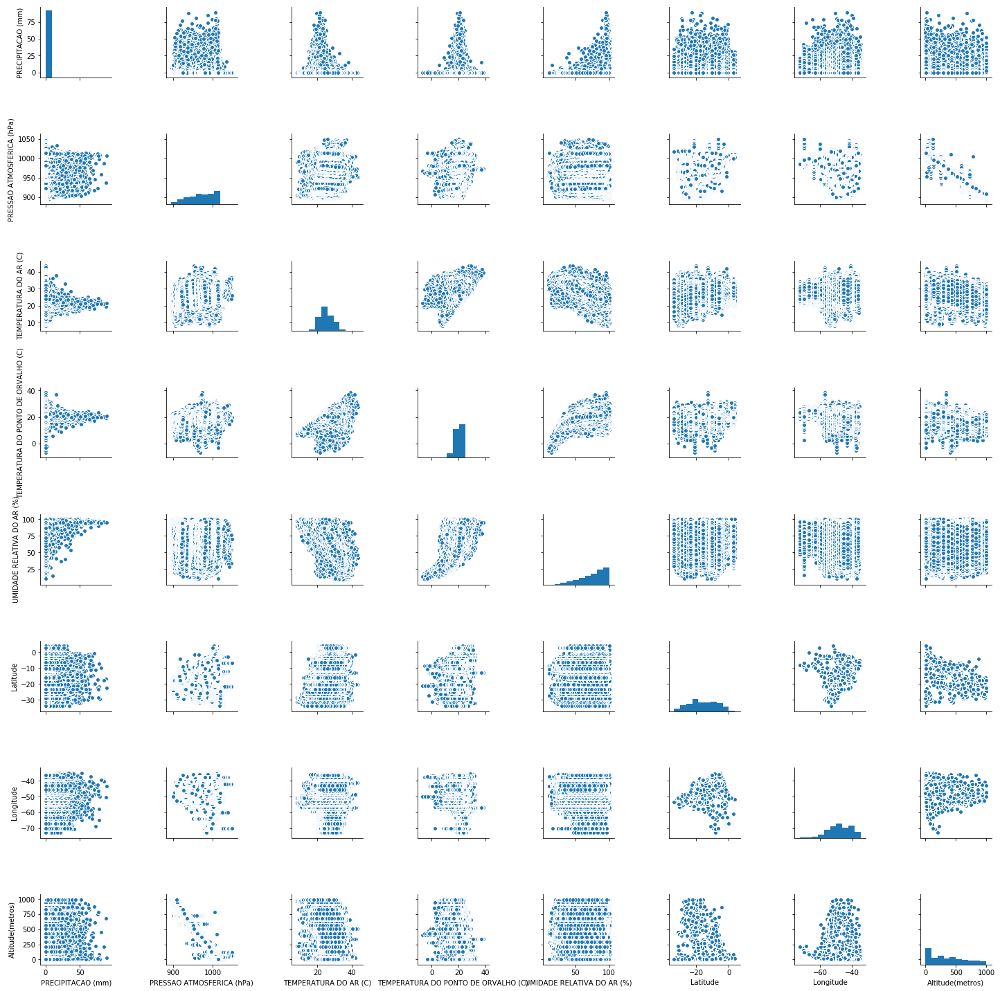

In [3]:
sns.pairplot(data[['PRECIPITACAO (mm)','PRESSAO ATMOSFERICA (hPa)','TEMPERATURA DO AR (C)',
                  'TEMPERATURA DO PONTO DE ORVALHO (C)','UMIDADE RELATIVA DO AR (%)','Latitude',
                  'Longitude','Altitude(metros)']])

### Fazendo a base de dados com as medias mensais de cada estação

In [2]:
data_mean = data.groupby(['Nome']).agg('mean')
#data_mean.to_csv('./Tempo-Clima/Dados/Brasil_2_mean.csv')
data_mean.head(5)

,Altitude(metros),Codigo OMM,Day,H(UTC),Latitude,Longitude,Month,PRECIPITACAO (mm),PRESSAO ATMOSFERICA (hPa),PRESSAO ATMOSFÉRICA MAXIMA (hPa),...,TEMPERATURA DO AR (C),TEMPERATURA DO PONTO DE ORVALHO (C),TEMPERATURA MAXIMA (C),TEMPERATURA MINIMA (C),TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C),TEMPERATURA MÍNIMA DO PONTO DE ORVALHO (C),UMIDADE RELATIVA DO AR (%),UMIDADE RELATIVA DO MAXIMA AR (%),UMIDADE RELATIVA DO MINIMA AR (%),Year
Nome,,,,,,,,,,,,,,,,,,,,,
Abrolhos-A422,21.0,86765.0,14.342558,11.526834,-17.963016,-38.703288,2.0,0.062558,1011.875577,1012.091258,...,27.061635,22.703732,27.438134,26.707338,23.128386,22.295178,77.356604,79.134382,75.533124,2012.864990
Acaraú-A360,67.0,81755.0,14.646465,11.500000,-3.121067,-40.087288,2.0,0.167845,1003.145665,1003.417866,...,26.763510,22.455934,27.345918,26.229398,22.874327,22.052125,79.125421,81.441709,76.664352,2013.010101
Afonso Cláudio-A657,507.0,86827.0,14.754386,11.500000,-20.104194,-41.106861,2.0,0.136330,956.387573,956.628363,...,25.172844,18.401060,26.209064,24.245431,19.216484,17.651133,68.985015,72.372076,65.493421,2014.245614
Aimorés-A534,288.0,86803.0,14.638834,11.519928,-19.532768,-41.090801,2.0,0.087022,985.983070,986.242869,...,26.704447,19.654924,27.470438,25.996772,20.279677,19.046690,68.021245,71.030468,64.930830,2012.005105
Alegre-A617,129.0,86828.0,14.653897,11.504052,-20.750412,-41.488852,2.0,0.146368,997.771239,998.031045,...,27.041579,19.732518,27.838544,26.311581,20.373567,19.147075,68.221600,71.498895,64.898188,2011.506999


In [3]:
data_mean['Precipitação Acum.(mm)'] = data.groupby(['Nome','Year']).agg('sum').groupby('Nome').agg('mean')['PRECIPITACAO (mm)']

data_mean.to_csv('./Tempo-Clima/Dados/Brasil_2_mean.csv')

In [4]:
data_mean.describe().T

,count,mean,std,min,25%,50%,75%,max
Altitude(metros),458.0,365.041836,283.263611,1.161000,104.750000,318.500000,557.250000,997.000000
Codigo OMM,458.0,85211.521834,2321.364258,81609.000000,81951.250000,86711.500000,86854.750000,86998.000000
Day,458.0,14.716247,0.347290,13.441386,14.582174,14.657739,14.823101,18.333333
H(UTC),458.0,11.575303,0.182531,10.000000,11.500000,11.516221,11.607779,13.281658
Latitude,458.0,-15.386842,8.270897,-33.742297,-21.949157,-15.312444,-8.505388,3.813583
Longitude,458.0,-47.960816,7.169973,-72.747838,-52.921473,-48.193060,-42.155827,-34.815627
Month,458.0,2.000000,0.000000,2.000000,2.000000,2.000000,2.000000,2.000000
PRECIPITACAO (mm),458.0,0.228806,0.118518,0.000000,0.139196,0.219439,0.299171,0.776980
PRESSAO ATMOSFERICA (hPa),458.0,970.632334,30.900937,903.079480,949.438490,974.775545,998.422340,1013.628806
PRESSAO ATMOSFÉRICA MAXIMA (hPa),458.0,970.655625,31.099888,887.633333,949.339697,974.661230,998.564971,1013.849143


In [21]:
tol_min = data_mean['UMIDADE RELATIVA DO AR (%)'].min()*0.02
tol_max = data_mean['UMIDADE RELATIVA DO AR (%)'].max()*0.02
print(data_mean['UMIDADE RELATIVA DO AR (%)'].min() - data_mean['UMIDADE RELATIVA DO AR (%)'].min()+tol_min)
print(y_train.min()*0.02 - (y_train.min() + y_train.min()*0.02)*0.02)

1.0174138744690893
0.00032000000000000084


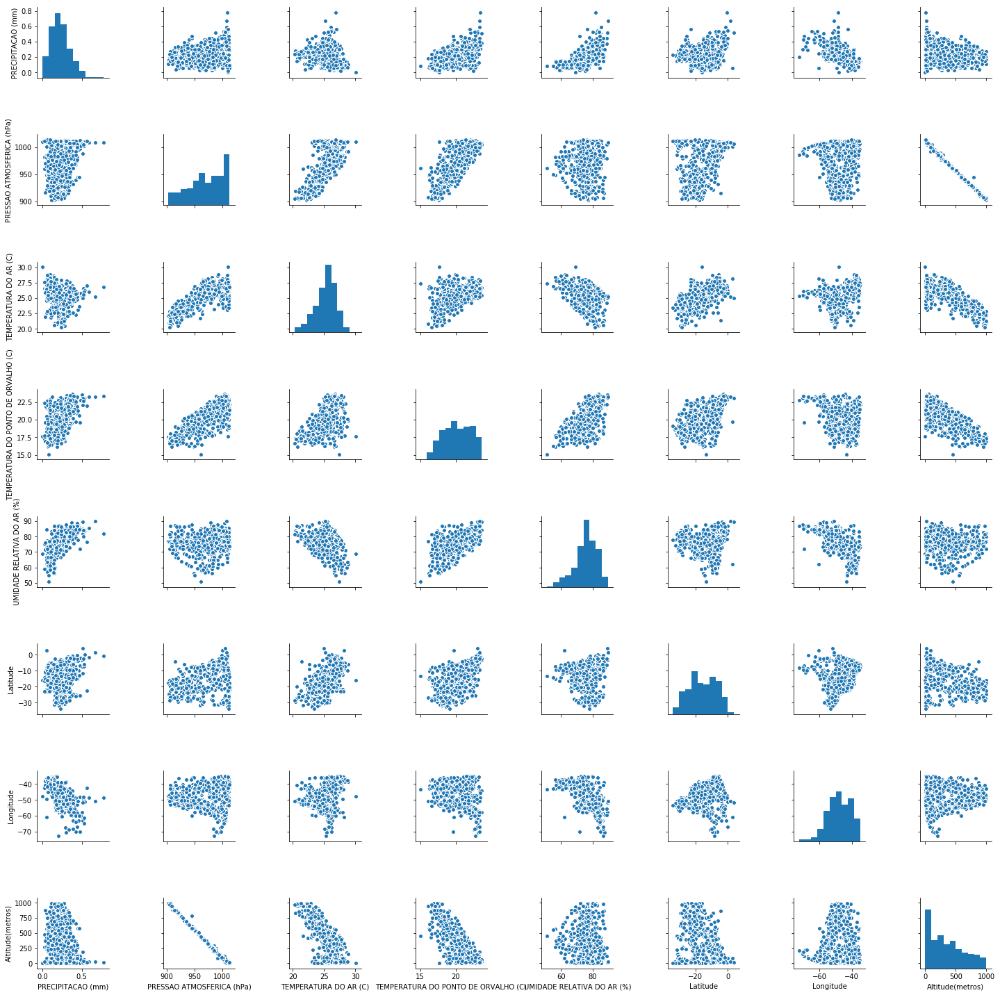

In [55]:
sns_plt = sns.pairplot(data_mean[['PRECIPITACAO (mm)','PRESSAO ATMOSFERICA (hPa)','TEMPERATURA DO AR (C)',
                  'TEMPERATURA DO PONTO DE ORVALHO (C)','UMIDADE RELATIVA DO AR (%)','Latitude',
                  'Longitude','Altitude(metros)']])
sns_plt.savefig("output.png")

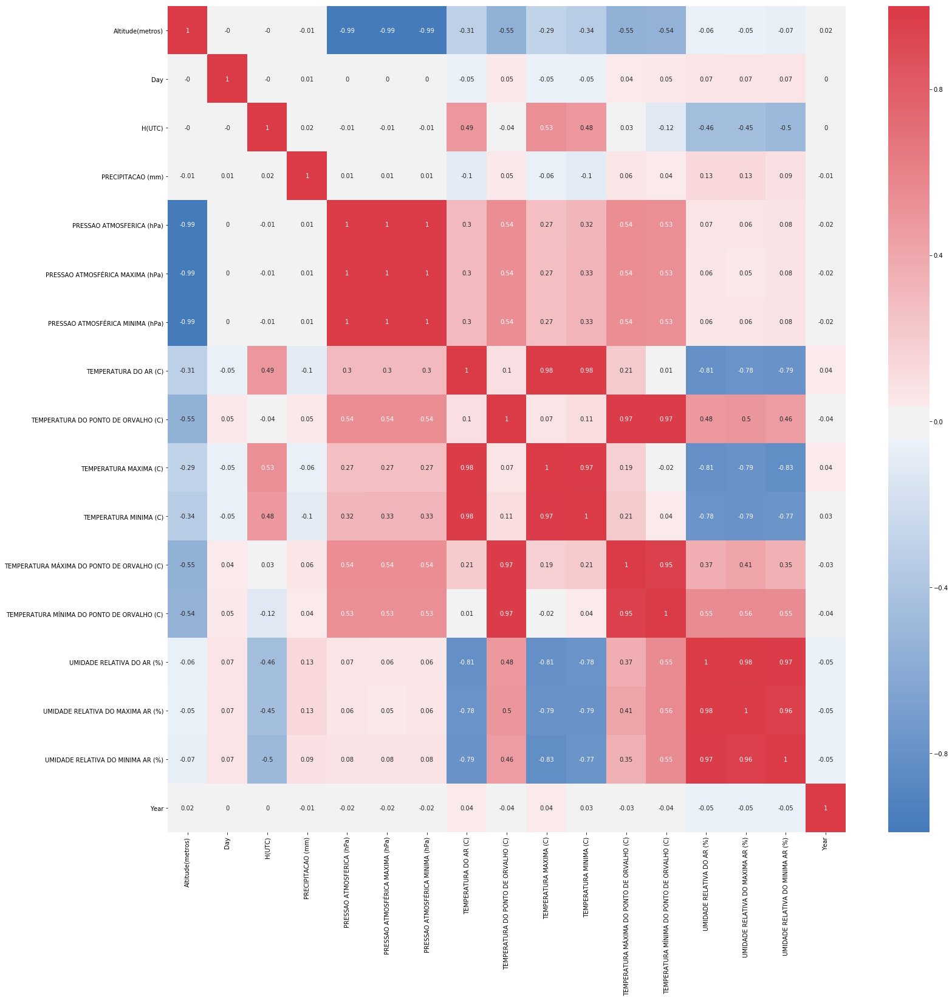

In [65]:
cor_matrix = data_clean[all_columns_num].corr().round(2)
# Plotting heatmap 
fig = plt.figure(figsize=(25,25));
sns_plot = sns.heatmap(cor_matrix, annot=True, center=0, cmap = sns.diverging_palette(250, 10, as_cmap=True), ax=plt.subplot(111));
plt.savefig('heatmap.png')
sns_plot.figure.savefig('heatmap.png')

In [8]:
target_wanderlay = ['UMIDADE RELATIVA DO AR (%)']
features_UR_wanderlay = data_mean.columns.tolist()
features_UR_wanderlay.remove('Day')
features_UR_wanderlay.remove('Month')
features_UR_wanderlay.remove('Codigo OMM')
features_UR_wanderlay.remove('Year')
features_UR_wanderlay.remove('H(UTC)')
#features_UR_wanderlay.remove('VENTO VELOCIDADE ')
#features_UR_wanderlay.remove('VENTO, DIRECAO (graus)')
#features_UR_wanderlay.remove('VENTO, RAJADA MAXIMA (m/s)')
features_UR_wanderlay.remove('UMIDADE RELATIVA DO AR (%)')
features_UR_wanderlay.remove('UMIDADE RELATIVA DO MINIMA AR (%)')
features_UR_wanderlay.remove('UMIDADE RELATIVA DO MAXIMA AR (%)')
features_UR_wanderlay.remove('TEMPERATURA MÍNIMA DO PONTO DE ORVALHO (C)')
features_UR_wanderlay.remove('TEMPERATURA MÁXIMA DO PONTO DE ORVALHO (C)')
features_UR_wanderlay.remove('TEMPERATURA DO PONTO DE ORVALHO (C)')
features_UR_wanderlay.remove('TEMPERATURA DO AR (C)')
#features_UR_wanderlay.remove('TEMPERATURA MAXIMA (C)')
#features_UR_wanderlay.remove('TEMPERATURA MINIMA (C)')
features_UR_wanderlay.remove('PRECIPITACAO (mm)')
features_UR_wanderlay.remove('PRESSAO ATMOSFERICA (hPa)')
features_UR_wanderlay.remove('PRESSAO ATMOSFÉRICA MAXIMA (hPa)')
features_UR_wanderlay.remove('PRESSAO ATMOSFÉRICA MINIMA (hPa)')




features_UR_wanderlay

['Altitude(metros)',
 'Latitude',
 'Longitude',
 'TEMPERATURA MAXIMA (C)',
 'TEMPERATURA MINIMA (C)']

In [9]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(data_mean[features_UR_wanderlay], data_mean[target_wanderlay],test_size=.25)

In [10]:
from sklearn.preprocessing import MinMaxScaler

scaler_x = MinMaxScaler(feature_range=(-0.8,0.8))
scaler_y = MinMaxScaler(feature_range=(-0.8,0.8))

scaler_x.fit(X_train)
X_train = scaler_x.transform(X_train)
X_test  = scaler_x.transform(X_test)

scaler_y.fit(y_train)
y_train = scaler_y.transform(y_train)
y_test  = scaler_y.transform(y_test)

In [13]:
from sklearn.neural_network import MLPRegressor

mlp = MLPRegressor(hidden_layer_sizes=(2*len(features_UR_wanderlay)+1), activation='logistic', solver='adam', alpha=0.0001, 
                  batch_size='auto',learning_rate='constant', learning_rate_init=0.09, power_t=0.5, max_iter=1000, shuffle=True, 
                   random_state=None, tol=0.0001, verbose=False, warm_start=False, momentum=0.9, nesterovs_momentum=True,
                   early_stopping=False, validation_fraction=0.1, beta_1=0.9, beta_2=0.999, epsilon=1e-08)

mlp = mlp.fit(X_train,y_train.ravel())
y_pred = mlp.predict(X_test)


In [14]:
import sklearn.metrics as metrics
print('Variance: {}'.format(metrics.explained_variance_score(scaler_y.inverse_transform(y_test).ravel(),scaler_y.inverse_transform([y_pred,]).ravel())))
print('Erro absoluto medio: {}'.format(metrics.mean_absolute_error(scaler_y.inverse_transform(y_test).ravel(),scaler_y.inverse_transform([y_pred,]).ravel())))
print('Erro quadrado medio: {}'.format(metrics.mean_squared_error(scaler_y.inverse_transform(y_test).ravel(),scaler_y.inverse_transform([y_pred,]).ravel())))
print('Erro absoluto mediano: {}'.format(metrics.median_absolute_error(scaler_y.inverse_transform(y_test).ravel(),scaler_y.inverse_transform([y_pred,]).ravel())))
print('R2 Score: {}'.format(metrics.r2_score(scaler_y.inverse_transform(y_test).ravel(),scaler_y.inverse_transform([y_pred,]).ravel())))

Variance: 0.7421069828630343
Erro absoluto medio: 2.1548968754379056
Erro quadrado medio: 12.66688718976772
Erro absoluto mediano: 1.5445324630492365
R2 Score: 0.7417812800645822


In [15]:
errors=abs(scaler_y.inverse_transform(y_test).ravel()-scaler_y.inverse_transform([y_pred,]))
print('Error(UR_true - UR_pred)')
print('MIN: {} \tMAX: {} \tMEAN: {}\tStd: {}'.format(errors.min(),errors.max(),errors.mean(),errors.std()))

Error(UR_true - UR_pred)
MIN: 0.011028273876945605 	MAX: 26.33610671671704 	MEAN: 2.1548968754379056	Std: 2.832544200183939


In [18]:
df_rest = pd.DataFrame(data = scaler_y.inverse_transform(y_test).ravel(),columns=['Y_true'])
df_rest['Y_pred'] = scaler_y.inverse_transform(y_test).ravel()
df_rest.head(5)

,Y_true,Y_pred
0,70.422272,70.422272
1,75.274269,75.274269
2,70.645515,70.645515
3,78.081291,78.081291
4,76.763244,76.763244


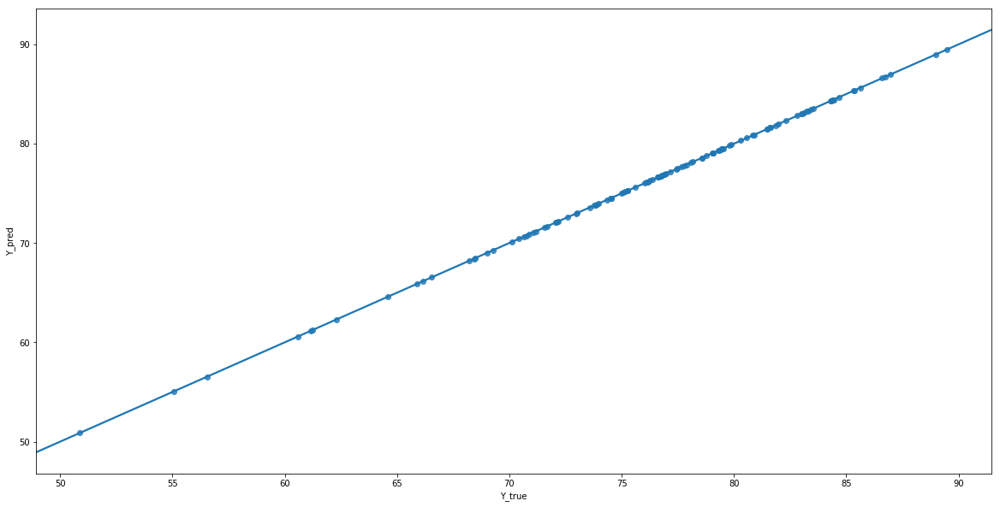

In [19]:
fig,ax = plt.subplots(figsize=(20,10))
sns.regplot(x="Y_true", y="Y_pred", data=df_rest,ax=ax)

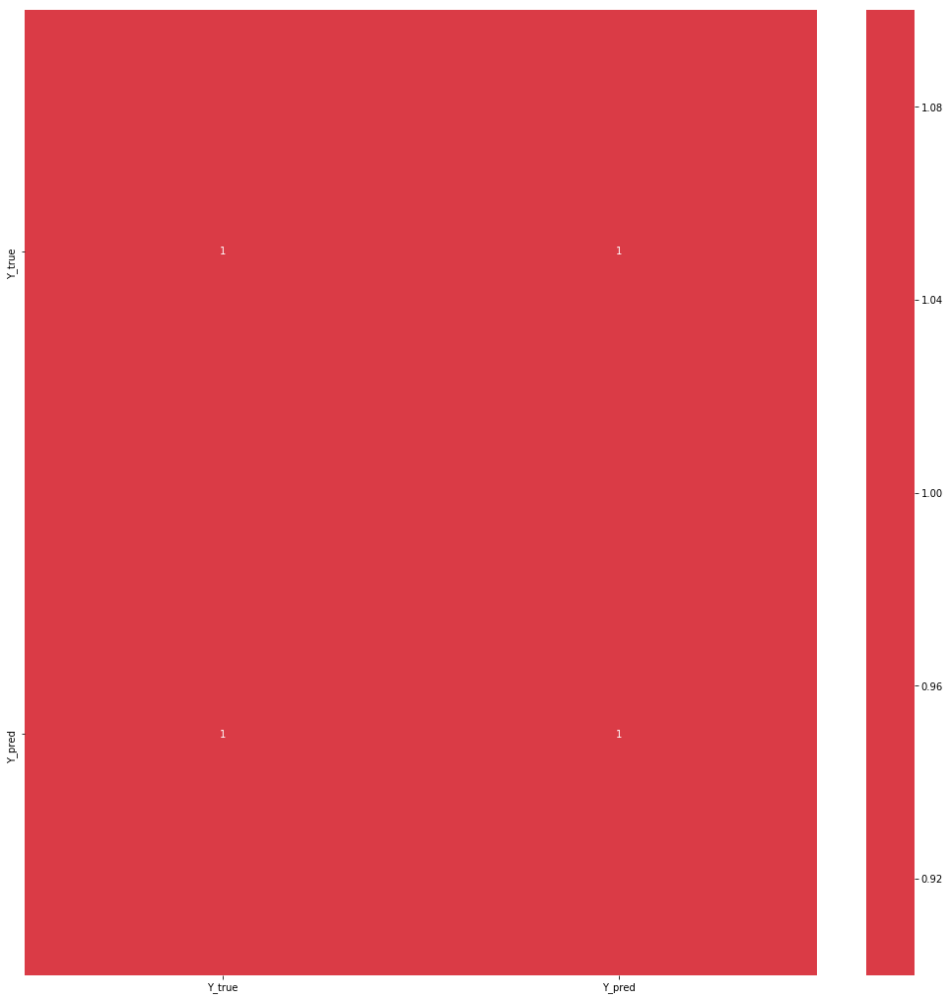

In [20]:
cor_matrix = df_rest.corr().round(2)
# Plotting heatmap 
fig = plt.figure(figsize=(18,18));
sns.heatmap(cor_matrix, annot=True, center=0, cmap = sns.diverging_palette(250, 10, as_cmap=True), ax=plt.subplot(111));
plt.show()

In [59]:
data_mean_per_year = data.groupby(['Nome','Year']).agg('mean')
#data_mean.to_csv('./Tempo-Clima/Dados/Brasil_2_mean.csv')
data_mean_per_year.index.get_level_values('Year')
#data_mean_per_year.head(10)

Int64Index([2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2010, 2011,
            ...
            2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2013, 2014],
           dtype='int64', name='Year', length=3928)

In [60]:
X_train, X_test, y_train, y_test = train_test_split(data_mean[features_UR_wanderlay], data_mean[target_wanderlay],test_size=.25)

In [61]:
scaler_x = MinMaxScaler(feature_range=(-0.8,0.8))
scaler_y = MinMaxScaler(feature_range=(-0.8,0.8))

scaler_x.fit(X_train)
X_train = scaler_x.transform(X_train)
X_test  = scaler_x.transform(X_test)

scaler_y.fit(y_train)
y_train = scaler_y.transform(y_train)
y_test  = scaler_y.transform(y_test)

In [67]:
mlp = MLPRegressor(hidden_layer_sizes=(2*len(features_UR_wanderlay)+1), activation='logistic', solver='adam', alpha=0.0001, 
                  batch_size='auto',learning_rate='constant', learning_rate_init=0.09, power_t=0.5, max_iter=400, shuffle=True, 
                   random_state=None, tol=0.0001, verbose=False, warm_start=False, momentum=0.9, nesterovs_momentum=True,
                   early_stopping=False, validation_fraction=0.1, beta_1=0.9, beta_2=0.999, epsilon=1e-08)

mlp = mlp.fit(X_train,y_train.ravel())
y_pred = mlp.predict(X_test)


In [68]:
print('Variance: {}'.format(metrics.explained_variance_score(y_test.ravel(),y_pred)))
print('Erro absoluto medio: {}'.format(metrics.mean_absolute_error(y_test.ravel(),y_pred)))
print('Erro quadrado medio: {}'.format(metrics.mean_squared_error(y_test.ravel(),y_pred)))
print('Erro absoluto mediano: {}'.format(metrics.median_absolute_error(y_test.ravel(),y_pred)))
print('R2 Score: {}'.format(metrics.r2_score(y_test.ravel(),y_pred)))

Variance: 0.8222334382286566
Erro absoluto medio: 0.07734003222994479
Erro quadrado medio: 0.011268129602798443
Erro absoluto mediano: 0.058130625726167895
R2 Score: 0.8123430744634572


In [69]:
errors=abs(scaler_y.inverse_transform(y_test).ravel()-scaler_y.inverse_transform([y_pred,]))
print('Error(UR_true - UR_pred)')
print('MIN: {}\tMAX: {}\tMEAN: {}\tStd: {}'.format(errors.min(),errors.max(),errors.mean(),errors.std()))

Error(UR_true - UR_pred)
MIN: 0.005804774732268925	MAX: 10.854059691096367	MEAN: 2.0275179148196214	Std: 1.906121547174624


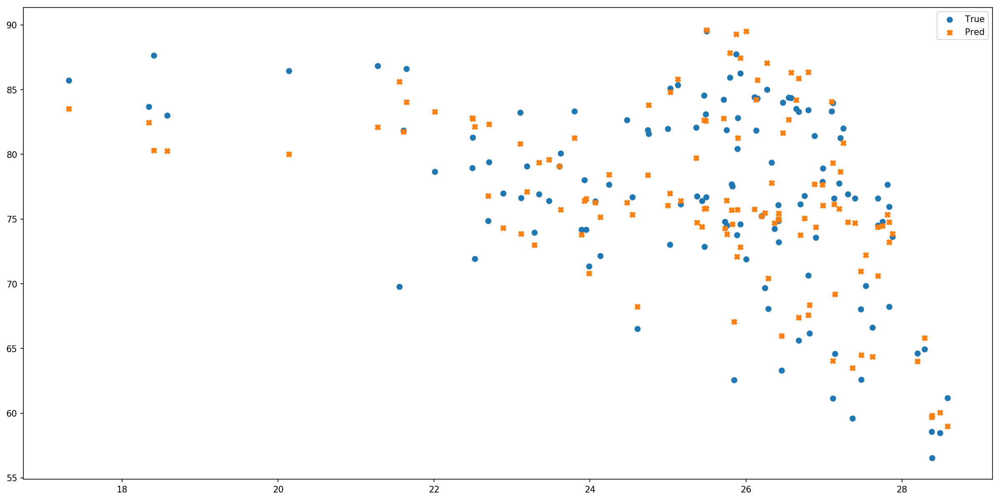

In [69]:
plt.figure(figsize=(20, 10), dpi=150)
plt.scatter(scaler_x.inverse_transform(X_test)[:,3],scaler_y.inverse_transform(y_test).ravel(),label='True')
plt.scatter(scaler_x.inverse_transform(X_test)[:,3],scaler_y.inverse_transform([y_pred,]),label='Pred',marker='X',)
plt.legend()

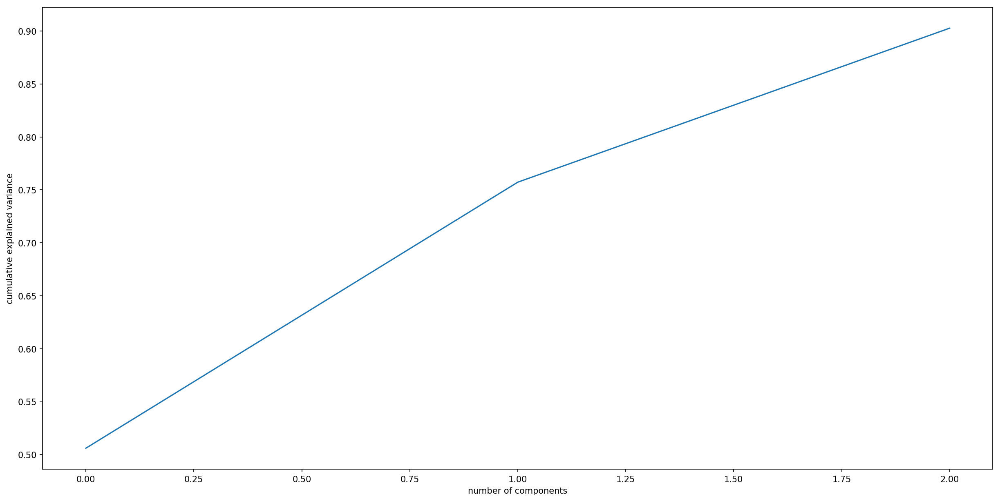

In [222]:
pca = decomposition.PCA(n_components=3)
x = MinMaxScaler(feature_range=(-0.8,0.8)).fit_transform(data[features_UR_wanderlay].values)

pca.fit(x)
X=pca.transform(x)
plt.figure(figsize=(20, 10), dpi=150)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

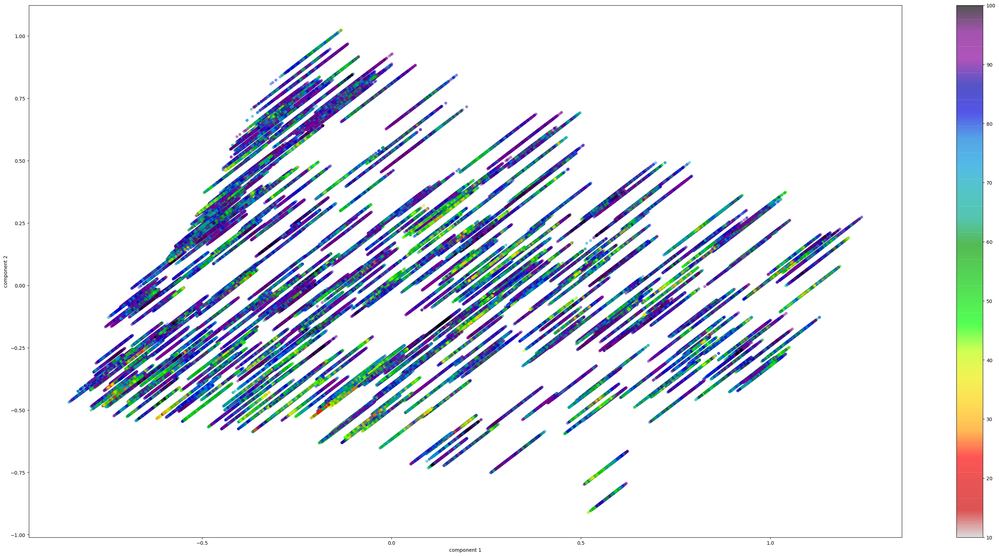

In [339]:
pcaDf = pd.DataFrame(data = X , columns = ['pca-1', 'pca-2','pca-3'])
pcaDf['Target'] = data[target_wanderlay]
plt.figure(figsize=(40,20),dpi=100)
plt.scatter(pcaDf['pca-1'], pcaDf['pca-2'],
            c=pcaDf['Target'], edgecolor='none', alpha=0.5,
            cmap=plt.cm.get_cmap('nipy_spectral_r', 1000))
plt.xlabel('component 1')
plt.ylabel('component 2')
plt.colorbar();

### Tratando dados ausentes

##### Os dados ques estão na lista de perigo (acima de 50% de dados ausentes) serão excluidos

In [32]:
len(danger_list)

18

In [33]:
danger_list

['Parque Estadual Chandless-A102',
 'Marechal Thaumaturgo-A137',
 'Humaitá-A112',
 'Tucumã-A234',
 'Cametá-A236',
 'Tangará da Serra-A902',
 'Apiacás-A910',
 'São Félix do Araguaia-A921',
 'Vila Bela da Santíssima Trindade-A922',
 'Porto Estrela-A935',
 'Santana do Livramento-A804',
 'Dionísio Cerqueira-A848',
 'Curitiba-A807',
 'Petrópolis - Pico do Couto-A610',
 'Três Rios-A625',
 'Saquarema - Sampaio Correia-A667',
 'Campos do Jordão-A706',
 'Calcanhar-A344']

In [34]:
map_miss_data

#### Retirando as estações com 100% de dados ausentes em todos as colunas

In [35]:
for name in danger_list[1:]:
    index_min = data.loc[lambda df: df.Nome == name, :].index.min()
    index_max = data.loc[lambda df: df.Nome == name, :].index.max()+1
    data.drop(range(index_min,index_max),inplace=True)

In [ ]:
df_miss_data.loc[df_miss_data['Md_ur_min']>30,:]

In [ ]:
len(recovery_list)

In [ ]:
df_temp.count()

In [ ]:
df_temp.loc[df_temp['Year']==2009,:]['TEMPERATURA MINIMA (C)'].interpolate(method='time')

In [ ]:
df_temp['Date']=0
for year,month,day,hour,i in zip(df_temp['Year'],df_temp['Month'],df_temp['Day'],df_temp['H(UTC)'],df_temp.index.tolist()):
    df_temp.loc[int(i),'Date'] = dt.datetime(int(year),int(month),int(day),int(hour))
df_temp = df_temp.set_index('Date')

Text(0.5,1,'Calcanhar-A344')

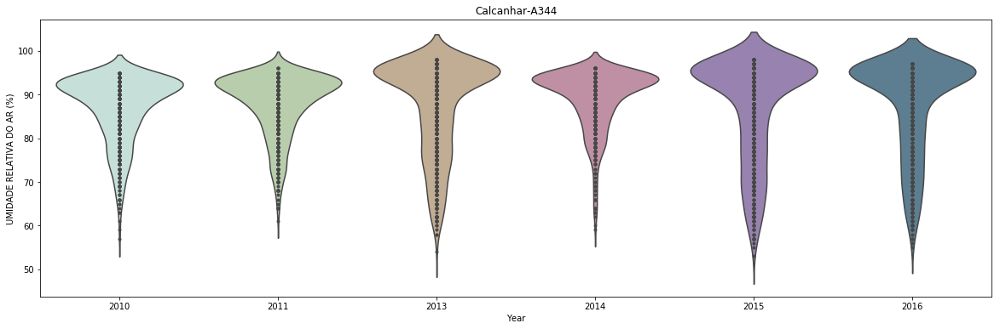

In [251]:
pal = sns.cubehelix_palette(8, rot=15, dark=.3)

fig,ax = plt.subplots(figsize=(20,6))
sns.violinplot(df_temp['Year'],df_temp['UMIDADE RELATIVA DO AR (%)'], palette=pal,
               inner="points",scale='width',ax=ax).set_title(name)


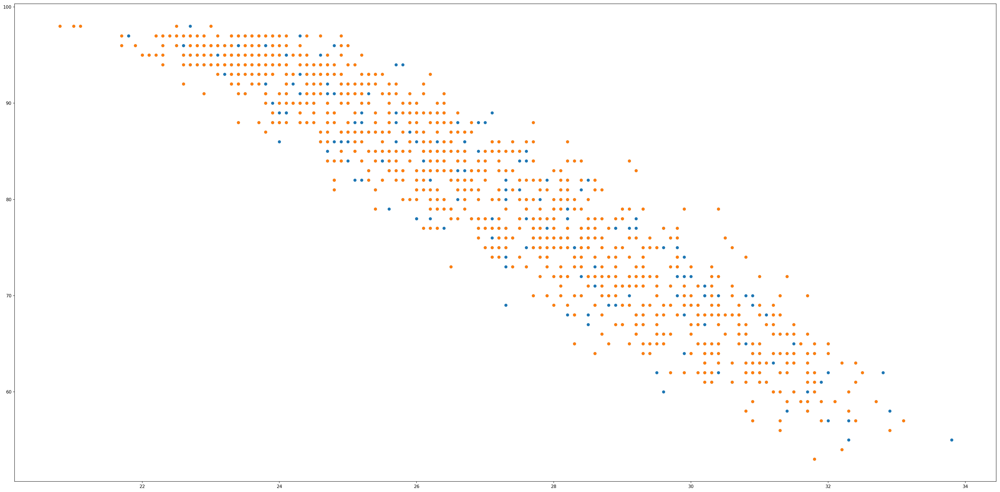

In [6]:
df_test2 = data.loc[data['Nome']=='Feijó-A138',:].reset_index().dropna()
X_train2, X_test2, y_train2, y_test2 = train_test_split(df_test2[all_features],df_test2['UMIDADE RELATIVA DO AR (%)'])
plt.figure(figsize=(40, 20), dpi=150)
plt.scatter(df_test2['TEMPERATURA DO AR (C)'],df_test2['UMIDADE RELATIVA DO AR (%)'])
plt.scatter(x=X_train2.values,y=y_train2.values)

In [222]:
type(X_train2.values)

numpy.ndarray

In [140]:
df_test2.loc[df_test2['TEMPERATURA DO AR (C)']>30,:].loc[df_test2['UMIDADE RELATIVA DO AR (%)']>80,:][['TEMPERATURA DO AR (C)','UMIDADE RELATIVA DO AR (%)']]

,TEMPERATURA DO AR (C),UMIDADE RELATIVA DO AR (%)


In [191]:
Lreg  = LinearRegression()

model_LR = Lreg.fit(X_train2,y_train2)
p_LR     = model_LR.predict(X_test2)
print('R2_score: {%.2f}'%metrics.r2_score(y_test2,p_LR))
print('Erro Absoluto medio: {%.2f}'%metrics.mean_absolute_error(y_test2,p_LR))
print('Erro quadrado medio: {%.2f}'%metrics.mean_squared_error(y_test2,p_LR))
print('Erro quadrado medio ao quadrado: {%.2F}'%np.sqrt(metrics.mean_squared_error(y_test2,p_LR)))


R2_score: {0.87}
Erro Absoluto medio: {3.09}
Erro quadrado medio: {14.83}
Erro quadrado medio ao quadrado: {3.85}


In [195]:
len(X_train2.values)

1012

In [4]:
df_temp = data.loc[data['Nome']=='Belo Horizonte - Cercadinho-F501',:].reset_index().dropna()
df_temp.rename(index=str,columns={'index':'old_index'},inplace=True)
from sklearn.grid_search import GridSearchCV
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor
from sklearn.linear_model import LinearRegression 
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPRegressor
from sklearn import metrics

all_features = ['TEMPERATURA DO AR (C)']

X_train, X_test, y_train, y_test = train_test_split(df_temp[all_features],df_temp['UMIDADE RELATIVA DO AR (%)'])
Lreg  = LinearRegression()

model_LR = Lreg.fit(X_train,y_train)
p_LR     = model_LR.predict(X_test)
print('R2_score: {%.2f}'%metrics.r2_score(y_test,p_LR))
print('Erro Absoluto medio: {%.2f}'%metrics.mean_absolute_error(y_test,p_LR))
print('Erro quadrado medio: {%.2f}'%metrics.mean_squared_error(y_test,p_LR))
print('Erro quadrado medio ao quadrado: {%.2F}'%np.sqrt(metrics.mean_squared_error(y_test,p_LR)))


R2_score: {0.88}
Erro Absoluto medio: {4.77}
Erro quadrado medio: {35.60}
Erro quadrado medio ao quadrado: {5.97}


/usr/local/lib/python3.6/dist-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/grid_search.py:42: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)


TypeError: scatter() missing 1 required positional argument: 'y'

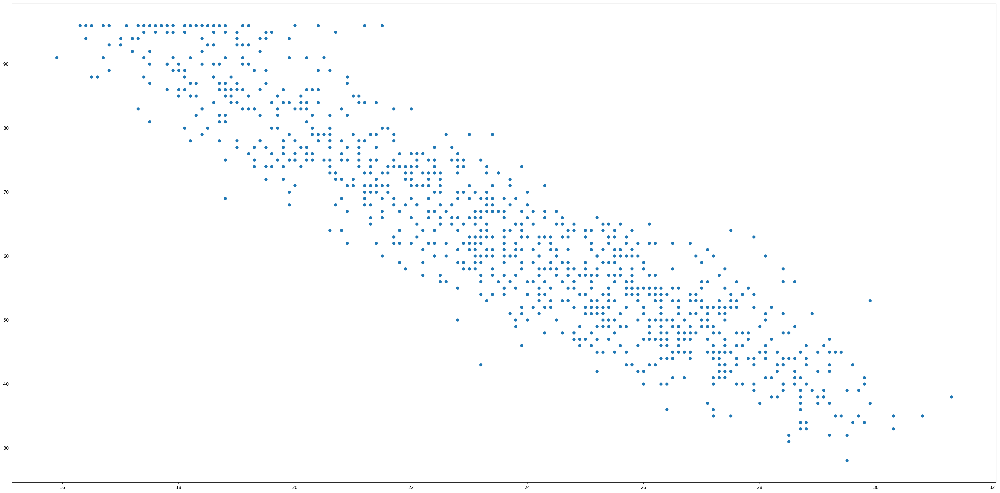

In [20]:
plt.figure(figsize=(40, 20), dpi=150)
plt.scatter(df_temp['TEMPERATURA DO AR (C)'].values,df_temp['UMIDADE RELATIVA DO AR (%)'].values)
fig = plt.scatter(X_train['TEMPERATURA DO AR (C)'],y_train.values)

In [144]:
df_temp.loc[df_temp['TEMPERATURA DO AR (C)']>30,:].loc[df_temp['UMIDADE RELATIVA DO AR (%)']>80,:][['TEMPERATURA DO AR (C)','UMIDADE RELATIVA DO AR (%)']]

,TEMPERATURA DO AR (C),UMIDADE RELATIVA DO AR (%)


In [ ]:
methods = ['from_derivatives','time']
df_temp2 = pd.DataFrame({m: df_temp['TEMPERATURA DO AR (C)'].interpolate(
    method=m,limit_direction = 'both', order = 3) for m in methods})
df_temp2['Original'] = df_temp['TEMPERATURA DO AR (C)']
#df_temp2.plot()

#line = df_temp2[].plot()
#line = line.get_figure()
#line.savefig(str(name +'.jpg'))